In [ ]:
##Karnataka_Precipitation


2020 - Processing bands 0 to 3
2020 - June: min=3.17, max=1237.55


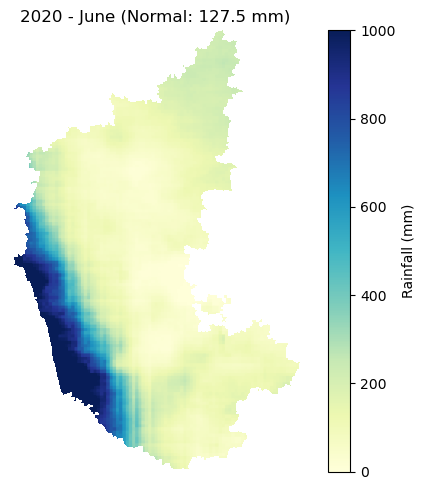

2020 - July: min=0.05, max=1338.99


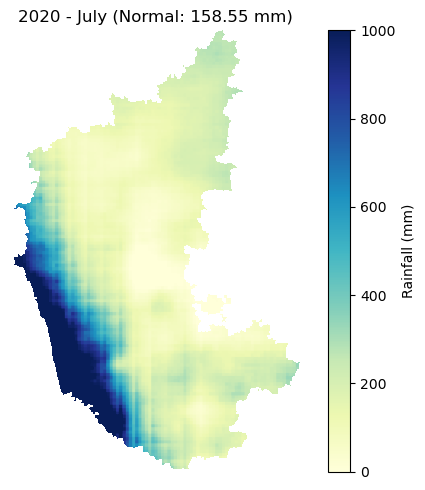

2020 - August: min=0.00, max=1266.13


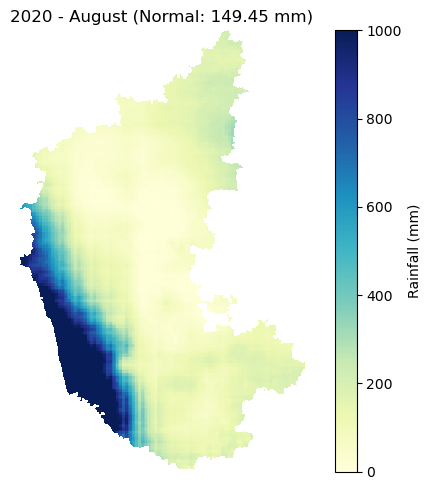

2020 - September: min=132.00, max=928.41


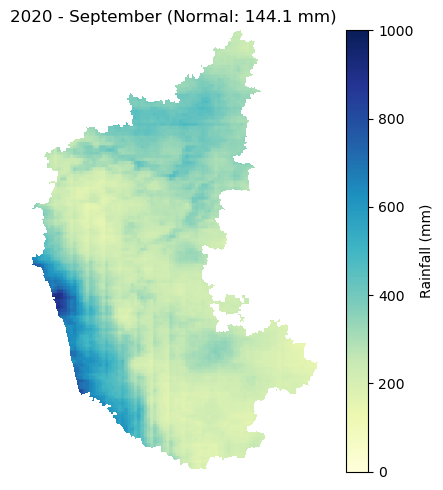

2020 - Total Rainfall (Karnataka only): min=221.34 mm, max=4482.45 mm


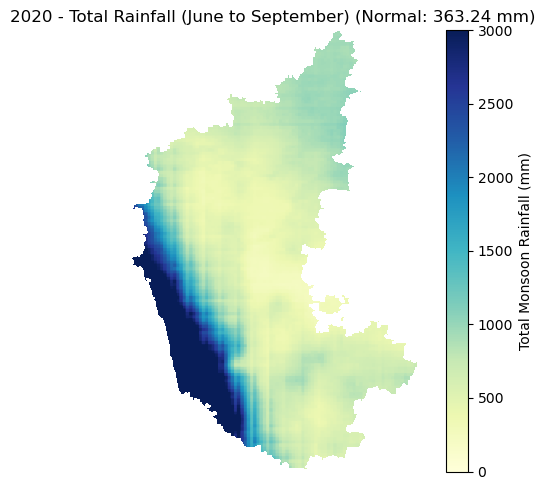


2021 - Processing bands 5 to 8
2021 - June: min=7.73, max=1097.96


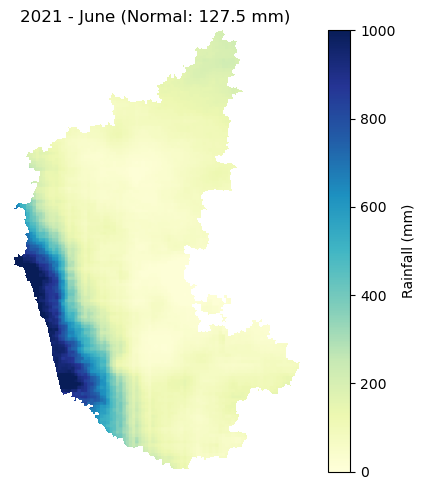

2021 - July: min=0.02, max=1406.61


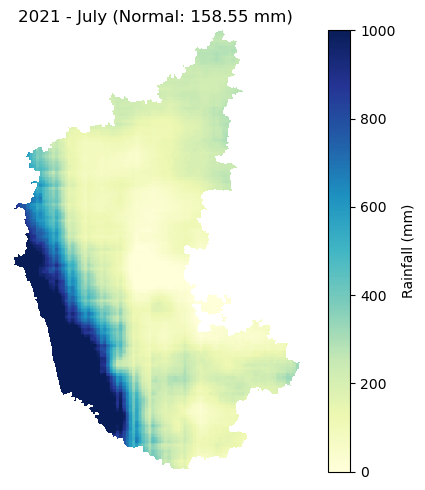

2021 - August: min=5.82, max=971.96


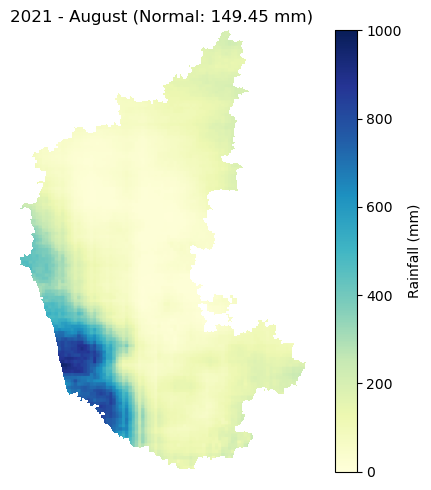

2021 - September: min=15.31, max=306.67


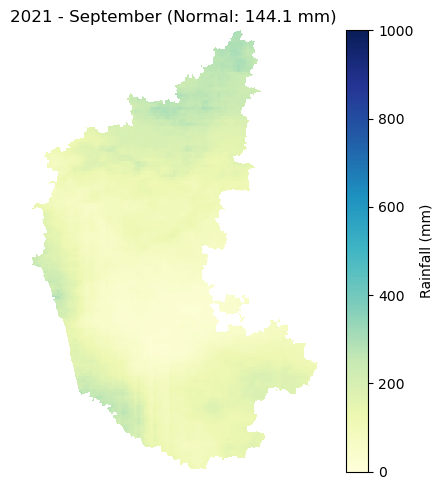

2021 - Total Rainfall (Karnataka only): min=51.20 mm, max=3369.53 mm


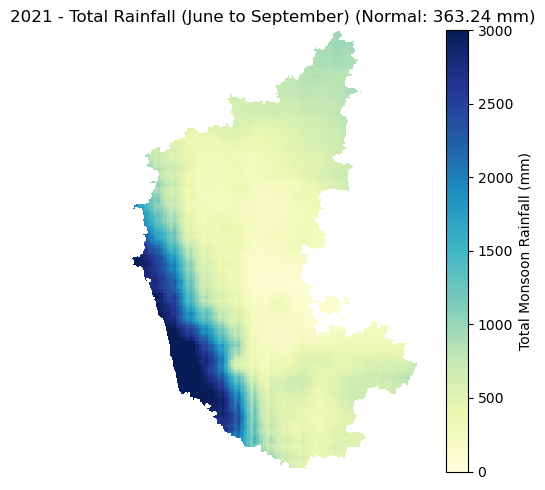


2022 - Processing bands 10 to 13
2022 - June: min=4.12, max=1090.24


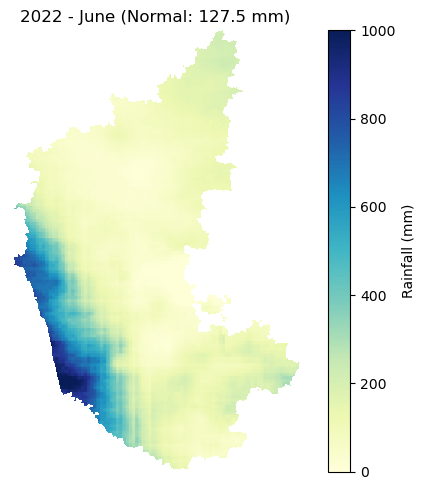

2022 - July: min=0.11, max=1600.58


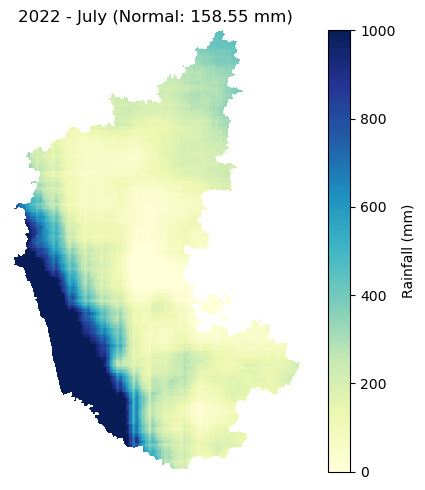

2022 - August: min=16.91, max=1299.93


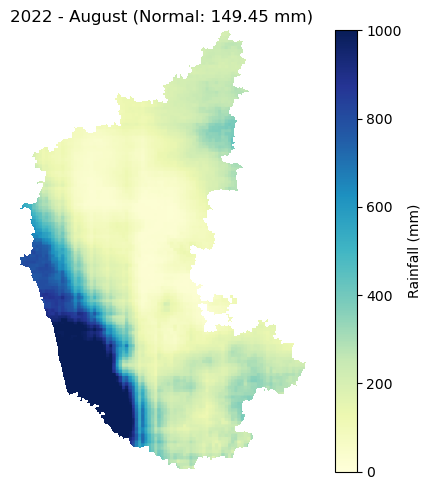

2022 - September: min=60.37, max=469.55


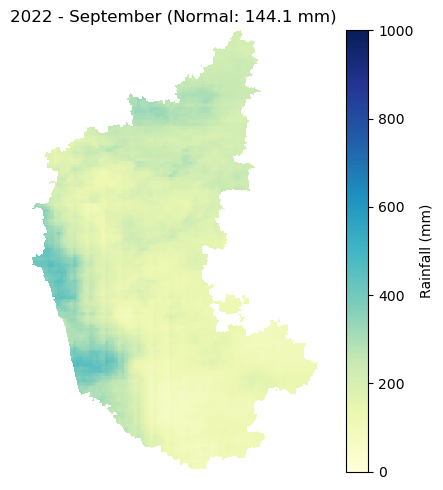

2022 - Total Rainfall (Karnataka only): min=150.73 mm, max=4252.34 mm


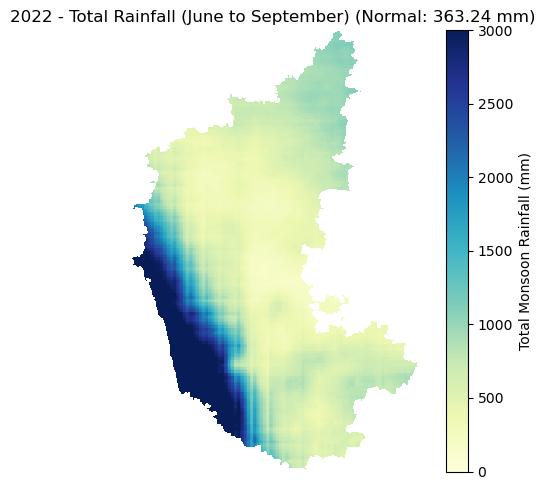


2023 - Processing bands 15 to 18
2023 - June: min=0.00, max=735.24


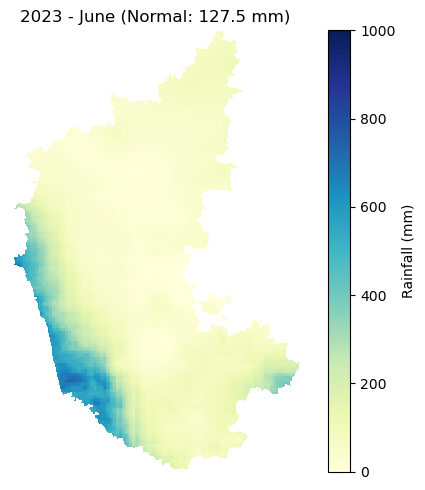

2023 - July: min=0.04, max=1789.44


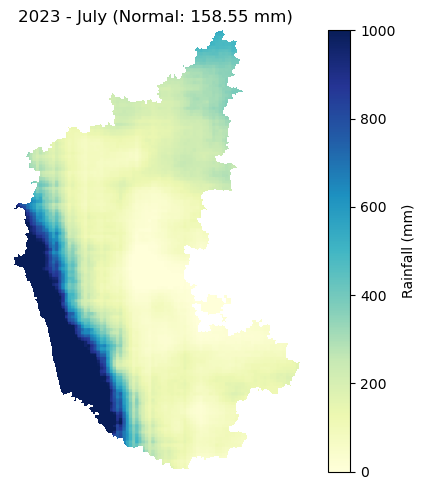

2023 - August: min=0.00, max=314.01


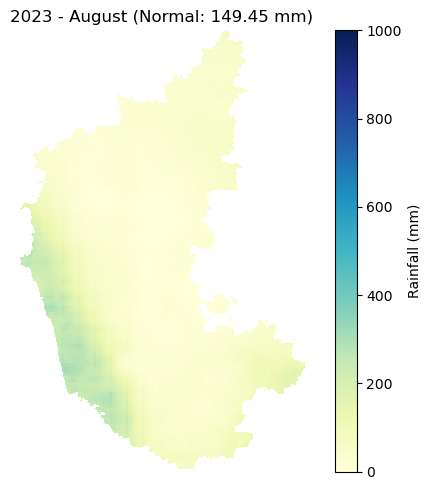

2023 - September: min=26.25, max=267.01


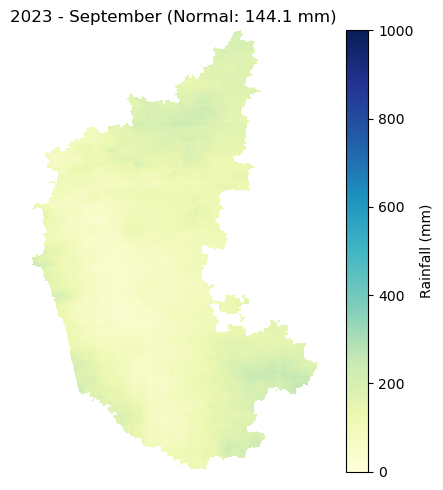

2023 - Total Rainfall (Karnataka only): min=63.24 mm, max=2848.76 mm


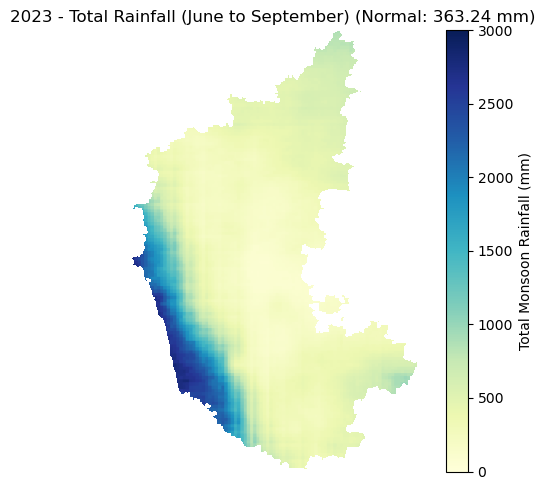


2024 - Processing bands 20 to 23
2024 - June: min=4.96, max=1335.31


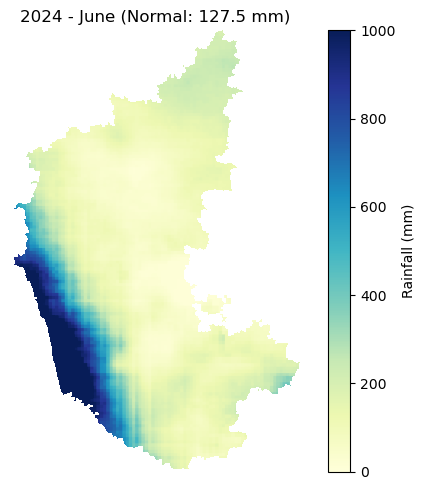

2024 - July: min=0.00, max=2236.54


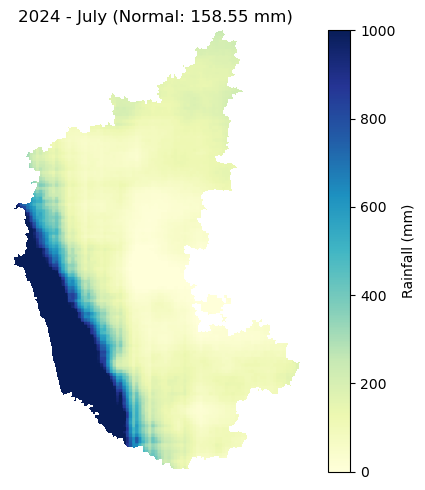

2024 - August: min=8.00, max=1487.02


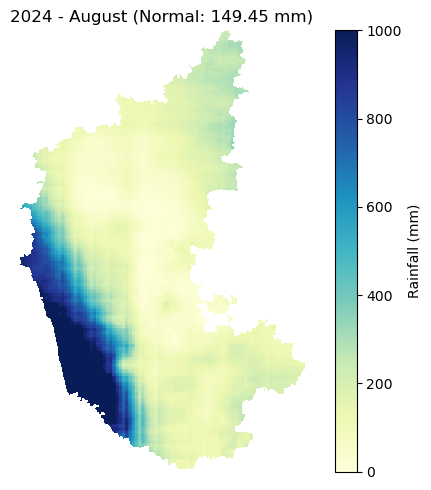

2024 - September: min=27.18, max=311.28


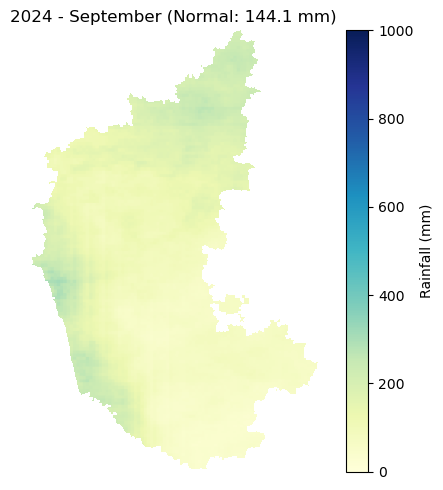

2024 - Total Rainfall (Karnataka only): min=74.05 mm, max=4847.62 mm


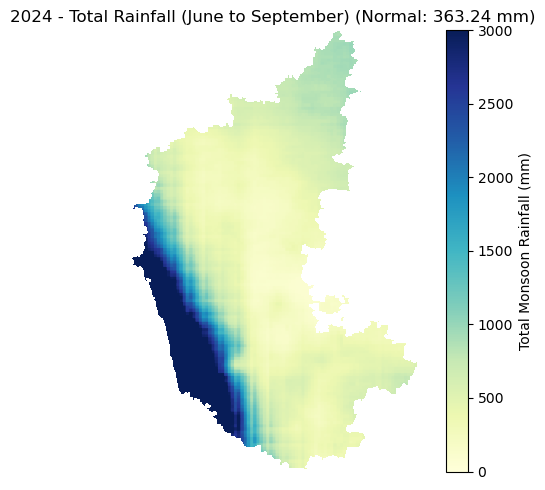

In [17]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from rasterio.mask import mask
from rasterio.io import MemoryFile
import os

# --- Configuration for Karnataka ---
tiff_path = "Karnataka_Y_Precipitation_CHIRPS.tif"
shapefile_path = "SateMask/gadm41_IND_1.shp"
years = [2020, 2021, 2022, 2023, 2024]
band_names = ['June', 'July', 'August', 'September']
normal = [127.5,158.55,149.45,144.1]  # June, July, August, September
total_normal = 363.24 
monthly_vmin, monthly_vmax = 0, 1000
total_vmin, total_vmax = 0, 3000
bands_per_year = 5  # 4 monsoon + 1 extra per year

# --- Load Karnataka boundary ---
gdf = gpd.read_file(shapefile_path)
kt_geom = gdf[gdf["NAME_1"] == "Karnataka"].geometry.values[0]
geojson_geom = [kt_geom.__geo_interface__]

# --- Load CHIRPS TIFF ---
if not os.path.exists(tiff_path):
    raise FileNotFoundError(f"{tiff_path} not found.")

with rasterio.open(tiff_path) as src:
    all_bands = src.read().astype(float)
    height, width = src.height, src.width
    transform = src.transform
    crs = src.crs

    needs_scaling = np.nanmax(all_bands) > 2000  # CHIRPS usually needs 0.01 scaling

    for year_idx, year in enumerate(years):
        start_band = year_idx * bands_per_year
        monsoon_bands = all_bands[start_band:start_band + 4]

        print(f"\n{year} - Processing bands {start_band} to {start_band+3}")

        # --- Plot each monsoon month ---
        for i in range(4):
            band = monsoon_bands[i]
            print(f"{year} - {band_names[i]}: min={np.nanmin(band):.2f}, max={np.nanmax(band):.2f}")

            plt.figure(figsize=(6, 5))
            plt.imshow(band, cmap='YlGnBu', vmin=monthly_vmin, vmax=monthly_vmax)
            plt.colorbar(label='Rainfall (mm)')
            plt.title(f"{year} - {band_names[i]} (Normal: {normal[i]} mm)")
            plt.axis('off')
            plt.tight_layout()
            plt.show()

        # --- Compute total rainfall ---
        if needs_scaling:
            monsoon_bands *= 1
            

        total_precip = np.nansum(monsoon_bands, axis=0)

        # --- Mask to Karnataka boundary ---
        with MemoryFile() as memfile:
            with memfile.open(driver='GTiff',
                              height=total_precip.shape[0],
                              width=total_precip.shape[1],
                              count=1,
                              dtype='float32',
                              transform=transform,
                              crs=crs) as temp_ds:
                temp_ds.write(total_precip.astype('float32'), 1)

                total_precip_masked, _ = mask(temp_ds, geojson_geom, crop=False, filled=True, nodata=np.nan)
                total_precip_masked = total_precip_masked[0]
                total_precip_masked[total_precip_masked == 0] = np.nan

        # --- Plot total rainfall ---
        total_min, total_max = np.nanmin(total_precip_masked), np.nanmax(total_precip_masked)
        print(f"{year} - Total Rainfall (Karnataka only): min={total_min:.2f} mm, max={total_max:.2f} mm")

        plt.figure(figsize=(6, 5))
        plt.imshow(total_precip_masked, cmap='YlGnBu', vmin=total_vmin, vmax=total_vmax)
        plt.colorbar(label='Total Monsoon Rainfall (mm)')
        plt.title(f"{year} - Total Rainfall (June to September) (Normal: {total_normal} mm)")
        plt.axis('off')
        plt.tight_layout()
        plt.show()


In [20]:
import rasterio
import numpy as np
import geopandas as gpd
from rasterio.mask import mask
from rasterio.io import MemoryFile
import pandas as pd
import os

# --- Configuration for Karnataka ---
tiff_path = "Karnataka_Y_Precipitation_CHIRPS.tif"
shapefile_path = "SateMask/gadm41_IND_1.shp"
band_names = ['June', 'July', 'August', 'September']
normal = [127.5, 158.55, 149.45, 144.1]
total_normal = sum(normal)
bands_per_year = 5
start_year = 2020

# --- Load Karnataka geometry ---
gdf = gpd.read_file(shapefile_path)
kt_geom = gdf[gdf["NAME_1"] == "Karnataka"].geometry.values[0]
geojson_geom = [kt_geom.__geo_interface__]

# --- Load TIFF ---
if not os.path.exists(tiff_path):
    raise FileNotFoundError(f"{tiff_path} not found.")

all_records = []

with rasterio.open(tiff_path) as src:
    all_bands = src.read().astype(float)
    transform = src.transform
    crs = src.crs
    total_band_count = all_bands.shape[0]
    total_years = total_band_count // bands_per_year
    years = list(range(start_year, start_year + total_years))

    needs_scaling = np.nanmax(all_bands) > 2000

    for year_idx, year in enumerate(years):
        start_band = year_idx * bands_per_year
        monsoon_bands = all_bands[start_band:start_band + 4]

        # --- Classify each monsoon month ---
        for i in range(4):
            band = monsoon_bands[i]
            rows, cols = np.where(~np.isnan(band))
            for r, c in zip(rows, cols):
                rainfall = band[r, c]
                x, y = rasterio.transform.xy(transform, r, c)
                norm = normal[i]

                if rainfall == 0:
                    cat = "NA"
                elif rainfall > 1.6 * norm:
                    cat = "Large Excess"
                elif rainfall > 1.2 * norm:
                    cat = "Excess"
                elif rainfall >= 0.8 * norm:
                    cat = "Normal"
                elif rainfall >= 0.4 * norm:
                    cat = "Deficit"
                else:
                    cat = "Scarcity"

                all_records.append({
                    "Year": year,
                    "Month": band_names[i],
                    "Rainfall_mm": rainfall,
                    "Latitude": y,
                    "Longitude": x,
                    "Category": cat
                })

        # --- Compute total rainfall and classify ---
        if needs_scaling:
            monsoon_bands *= 1  # no scaling applied here

        total_precip = np.nansum(monsoon_bands, axis=0)

        with MemoryFile() as memfile:
            with memfile.open(driver='GTiff', height=total_precip.shape[0], width=total_precip.shape[1],
                              count=1, dtype='float32', transform=transform, crs=crs) as temp_ds:
                temp_ds.write(total_precip.astype('float32'), 1)
                masked, _ = mask(temp_ds, geojson_geom, crop=False, filled=True, nodata=np.nan)
                masked = masked[0]
                masked[masked == 0] = np.nan

        rows, cols = np.where(~np.isnan(masked))
        for r, c in zip(rows, cols):
            rainfall = masked[r, c]
            x, y = rasterio.transform.xy(transform, r, c)

            if rainfall == 0:
                cat = "NA"
            elif rainfall > 1.6 * total_normal:
                cat = "Large Excess"
            elif rainfall > 1.2 * total_normal:
                cat = "Excess"
            elif rainfall >= 0.8 * total_normal:
                cat = "Normal"
            elif rainfall >= 0.4 * total_normal:
                cat = "Deficit"
            else:
                cat = "Scarcity"

            all_records.append({
                "Year": year,
                "Month": "Total",
                "Rainfall_mm": rainfall,
                "Latitude": y,
                "Longitude": x,
                "Category": cat
            })

# --- Save to CSV ---
df = pd.DataFrame(all_records)
df.to_csv("Karnataka_Y_Precipitation_GT.csv", index=False)
print("✅ CSV saved: Karnataka_Y_Precipitation_GT.csv")


✅ CSV saved: rainfall_classification_karnataka_all_years.csv


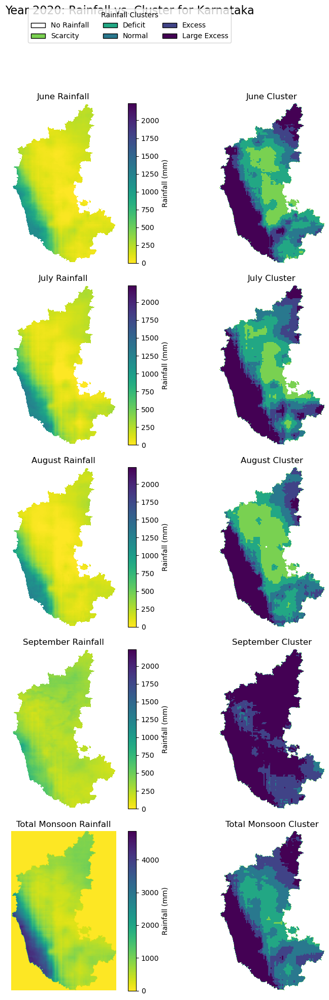

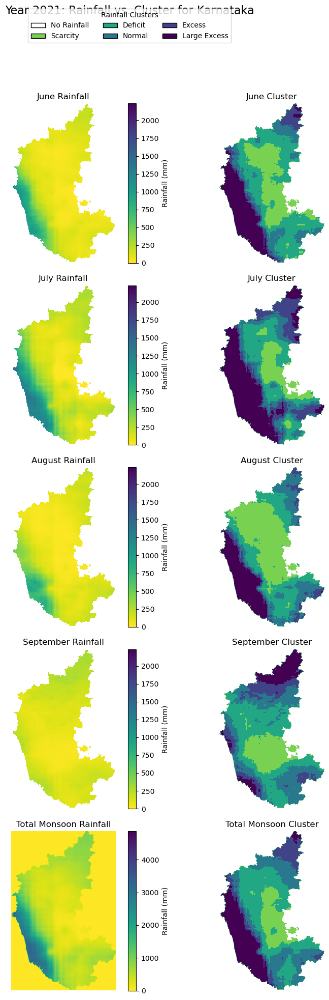

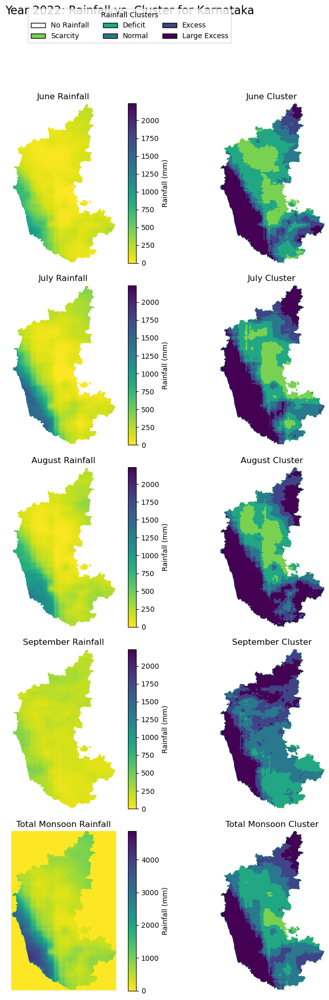

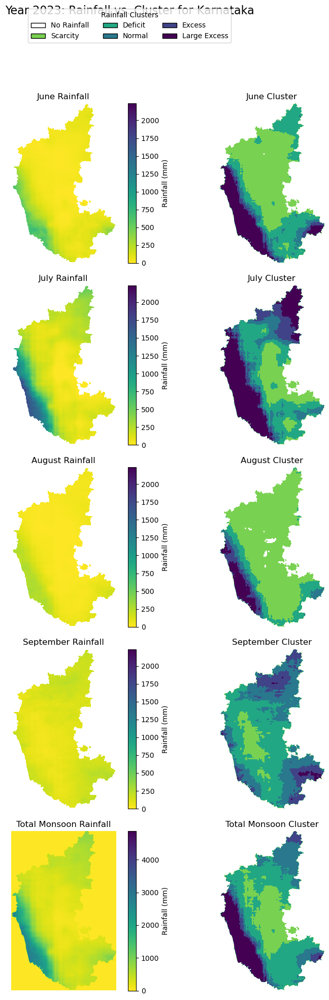

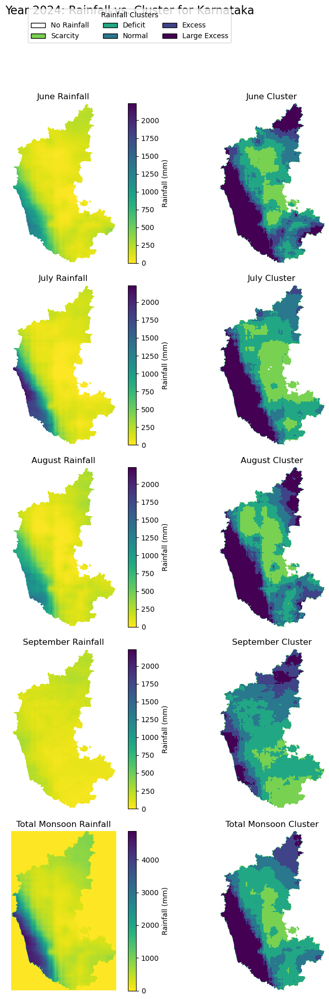

In [7]:
import rasterio
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if necessary)
# -----------------------------------------------------------------------------
tiff_path = "Karnataka_Y_Precipitation_CHIRPS.tif"
csv_path  = "Karnataka_Y_Precipitation_GT.csv"

# -----------------------------------------------------------------------------
# 2) LOAD THE CSV (must contain columns: Year, Month, Latitude, Longitude, Category)
# -----------------------------------------------------------------------------
df = pd.read_csv(csv_path)

# -----------------------------------------------------------------------------
# 3) OPEN THE MULTI‐BAND TIFF (keep it open for indexing later)
# -----------------------------------------------------------------------------
src = rasterio.open(tiff_path)
all_bands = src.read().astype(np.float32)  # shape: (total_bands, H, W)
height, width = src.height, src.width
transform, crs = src.transform, src.crs

# -----------------------------------------------------------------------------
# 4) CONFIGURATION
# -----------------------------------------------------------------------------
start_year     = 2020
bands_per_year = 5    # (4 monsoon months + 1 “slot” per year)
month_to_index = {
    "June":      0,
    "July":      1,
    "August":    2,
    "September": 3,
    "Total":     4
}
band_names = ['June', 'July', 'August', 'September']

# Determine how many full years are in the TIFF
total_band_count = all_bands.shape[0]
total_years = total_band_count // bands_per_year
years = list(range(start_year, start_year + total_years))

# -----------------------------------------------------------------------------
# 5) CALCULATE vmin/vmax FOR RAINFALL (monthly & total) ACROSS THE ENTIRE TIFF
# -----------------------------------------------------------------------------
# 5a) Stack every year's 4 monthly bands (shape: 4 * total_years, H, W)
monthly_stack_all = []
for yidx in range(total_years):
    base = yidx * bands_per_year
    monthly_stack_all.append(all_bands[base : base + 4])
monthly_stack_all = np.concatenate(monthly_stack_all, axis=0)
vmin_month = np.nanmin(monthly_stack_all)
vmax_month = np.nanmax(monthly_stack_all)

# 5b) For each year, sum its 4 monsoon bands → stack, then find vmin_total/vmax_total
total_stack = []
for yidx in range(total_years):
    base = yidx * bands_per_year
    four_months = all_bands[base : base + 4]
    total_stack.append(np.nansum(four_months, axis=0))
total_stack = np.stack(total_stack, axis=0)
vmin_total = np.nanmin(total_stack)
vmax_total = np.nanmax(total_stack)

# -----------------------------------------------------------------------------
# 6) BUILD A CUSTOM “CLUSTER” COLORMAP
# -----------------------------------------------------------------------------
cluster_to_id = {
    'no rainfall':  0,
    'scarcity':     1,
    'deficit':      2,
    'normal':       3,
    'excess':       4,
    'large excess': 5
}
max_cid = len(cluster_to_id) - 1  # = 5

base_cmap = plt.get_cmap('viridis_r')
colors = []
for cid in range(max_cid + 1):
    if cid == 0:
        colors.append('#ffffff')
    else:
        frac = cid / max_cid
        colors.append(base_cmap(frac))

cluster_cmap = ListedColormap(colors)
legend_handles = [
    Patch(facecolor=colors[cid], edgecolor='black', label=label.title())
    for label, cid in cluster_to_id.items()
]rainfall_classification_karnataka_all_years.csv

# -----------------------------------------------------------------------------
# 7) FOR EACH YEAR: PLOT 5 ROWS × 2 COLUMNS → (rainfall vs. cluster)
# -----------------------------------------------------------------------------
for year_idx, year in enumerate(years):
    base = year_idx * bands_per_year
    # 7a) Extract this year’s 4 monthly rainfall bands
    monthly_bands = all_bands[base : base + 4]  # shape: (4, H, W)

    # 7b) Compute “Total Monsoon” for this year
    total_precip = np.nansum(monthly_bands, axis=0)  # shape: (H, W)

    # 7c) Build a 5×H×W cluster‐stack (indices 0..3 = months, 4 = Total)
    cluster_stack = np.zeros((5, height, width), dtype=np.uint8)

    # Filter CSV to only this year’s rows
    df_year = df[df['Year'] == year]

    # 7d) Fill cluster_stack from CSV
    for _, row in df_year.iterrows():
        m = str(row['Month']).strip()
        if m not in month_to_index:
            continue
        idx = month_to_index[m]
        lat = float(row['Latitude'])
        lon = float(row['Longitude'])
        try:
            r, c = src.index(lon, lat)
        except:
            continue
        if not (0 <= r < height and 0 <= c < width):
            continue

        cat = str(row['Category']).strip().lower()
        cid = cluster_to_id.get(cat, 0)
        cluster_stack[idx, r, c] = cid

    # 7e) Build a “rain_cmap” that paints NaN as white
    rain_cmap = plt.get_cmap('viridis_r').copy()
    rain_cmap.set_bad('white')

    # 7f) Create the 5×2 subplot grid
    fig, axs = plt.subplots(5, 2, figsize=(12, 20))
    fig.suptitle(f"Year {year}: Rainfall vs. Cluster for Karnataka", fontsize=16)

    # Rows 0..3 → monthly rainfall and cluster
    for i in range(4):
        # Left: monthly rainfall
        im0 = axs[i, 0].imshow(
            monthly_bands[i],
            cmap='viridis_r',
            vmin=vmin_month,
            vmax=vmax_month
        )
        axs[i, 0].set_title(f"{band_names[i]} Rainfall")
        axs[i, 0].axis('off')
        plt.colorbar(im0, ax=axs[i, 0], fraction=0.046, pad=0.04, label='Rainfall (mm)')

        # Right: monthly cluster
        im1 = axs[i, 1].imshow(
            cluster_stack[i],
            cmap=cluster_cmap,
            vmin=0,
            vmax=max_cid
        )
        axs[i, 1].set_title(f"{band_names[i]} Cluster")
        axs[i, 1].axis('off')

    # Row 4 → total monsoon rainfall & cluster
    # Left: total monsoon rainfall
    im_tot = axs[4, 0].imshow(
        total_precip,
        cmap=rain_cmap,
        vmin=vmin_total,
        vmax=vmax_total
    )
    axs[4, 0].set_title("Total Monsoon Rainfall")
    axs[4, 0].axis('off')
    plt.colorbar(im_tot, ax=axs[4, 0], fraction=0.046, pad=0.04, label='Rainfall (mm)')

    # Right: “Total” cluster
    im_clust_tot = axs[4, 1].imshow(
        cluster_stack[4],
        cmap=cluster_cmap,
        vmin=0,
        vmax=max_cid
    )
    axs[4, 1].set_title("Total Monsoon Cluster")
    axs[4, 1].axis('off')

    # Shared legend at top
    fig.legend(
        handles=legend_handles,
        loc='upper center',
        ncol=3,
        frameon=True,
        title="Rainfall Clusters",
        bbox_to_anchor=(0.5, 0.98)
    )

    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

# -----------------------------------------------------------------------------
# 8) CLOSE THE RASTER
# -----------------------------------------------------------------------------
src.close()


Categorical GeoTIFF saved as: Karnataka_Y_Precipitation_GT_geotif.tif


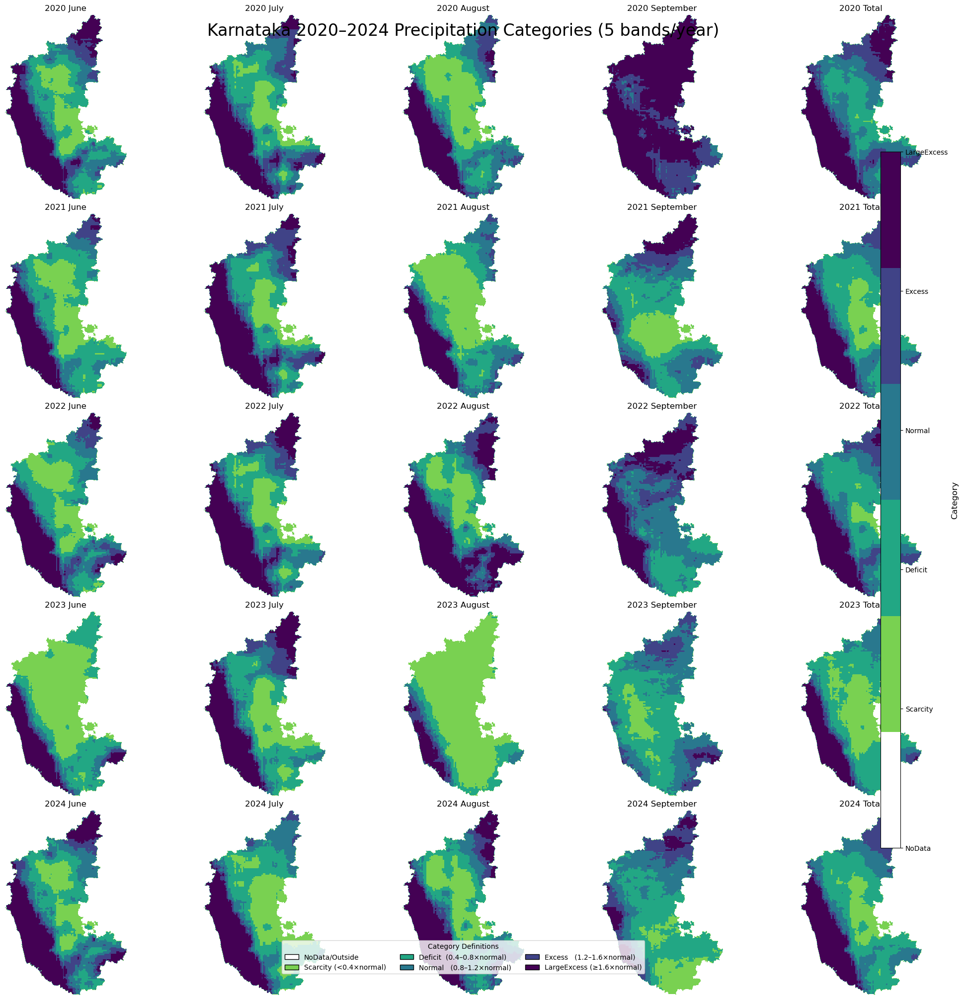

In [40]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) PATH TO YOUR 25‐BAND PRECIPITATION TIFF FOR KARNATAKA
# -----------------------------------------------------------------------------
#   Replace with the actual path if different
tiff_path = "Karnataka_Y_Precipitation_CHIRPS.tif"
if not os.path.isfile(tiff_path):
    raise FileNotFoundError(f"Cannot find {tiff_path!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ ALL 25 BANDS INTO A NumPy ARRAY
# -----------------------------------------------------------------------------
with rasterio.open(tiff_path) as src:
    all_bands = src.read().astype(np.float32)  # shape = (25, H, W)
    profile   = src.profile.copy()
    height, width = src.height, src.width

n_bands = all_bands.shape[0]
if n_bands != 25:
    raise ValueError(f"Expected 25 bands (2020–2024 × 5 each), but found {n_bands}")

# -----------------------------------------------------------------------------
# 3) DEFINE “NORMAL” VALUES FOR KARNATAKA (June, July, August, September, Total)
#    INDEX 0 = June, 1 = July, 2 = August, 3 = September, 4 = Total Monsoon
# -----------------------------------------------------------------------------
# These values (in mm) are approximate long‐term monsoon normals for Karnataka;
# adjust as needed based on your reference data.
normals = np.array([
    127.5,  # June
    158.55,  # July
    149.5,  # August
    144.1,  # September
    579.6  # Total Monsoon
], dtype=np.float32)

# -----------------------------------------------------------------------------
# 4) CATEGORY THRESHOLDS (as MULTIPLES of “NORMAL”)
#    - Scarcity    : value < 0.4 × normal
#    - Deficit     : 0.4 ≤ value/normal < 0.8
#    - Normal      : 0.8 ≤ value/normal < 1.2
#    - Excess      : 1.2 ≤ value/normal < 1.6
#    - LargeExcess : value/normal ≥ 1.6
# -----------------------------------------------------------------------------
def categorize_precip(band_data: np.ndarray, normal_value: float) -> np.ndarray:
    """
    Given a 2D array band_data and a scalar normal_value,
    returns a 2D integer array of the same shape with:
       0 → Scarcity   (value < 0.4×normal)
       1 → Deficit    (0.4×normal ≤ value < 0.8×normal)
       2 → Normal     (0.8×normal ≤ value < 1.2×normal)
       3 → Excess     (1.2×normal ≤ value < 1.6×normal)
       4 → LargeExcess(value ≥ 1.6×normal)
      -1 → NoData / outside Karnataka (where original band_data is NaN)
    """
    cat = np.full(band_data.shape, -1, dtype=np.int8)
    valid_mask = ~np.isnan(band_data)
    valid_vals = band_data[valid_mask]
    ratio = valid_vals / normal_value

    cat_vals = np.full(valid_vals.shape, -1, dtype=np.int8)
    cat_vals[np.where(ratio < 0.4)] = 0
    cat_vals[np.where((ratio >= 0.4) & (ratio < 0.8))] = 1
    cat_vals[np.where((ratio >= 0.8) & (ratio < 1.2))] = 2
    cat_vals[np.where((ratio >= 1.2) & (ratio < 1.6))] = 3
    cat_vals[np.where(ratio >= 1.6)] = 4

    cat[valid_mask] = cat_vals
    return cat

# -----------------------------------------------------------------------------
# 5) APPLY CATEGORIZATION TO ALL 25 BANDS
# -----------------------------------------------------------------------------
category_stack = np.full(all_bands.shape, fill_value=-1, dtype=np.int8)

for band_idx in range(n_bands):
    month_index = band_idx % 5
    normal_val  = normals[month_index]
    band_data   = all_bands[band_idx]  # shape = (H, W)
    category_stack[band_idx] = categorize_precip(band_data, normal_val)

# -----------------------------------------------------------------------------
# 6) EXPORT THE CATEGORY STACK AS A NEW 25‐BAND GeoTIFF
#    Filename: “Karnataka_Y_Precipitation_GT_geotif.tif”
# -----------------------------------------------------------------------------
out_profile = profile.copy()
out_profile.update({
    "count": 25,
    "dtype": rasterio.int8,
    "nodata": -1
})

output_path = "Karnataka_Y_Precipitation_GT_geotif.tif"
with rasterio.open(output_path, "w", **out_profile) as dst:
    dst.write(category_stack)

print(f"Categorical GeoTIFF saved as: {output_path}")

# -----------------------------------------------------------------------------
# 7) SET UP A DISCRETE COLORMAP FOR THE 5 CATEGORIES + “NoData” AS WHITE
#    0 → NoData/Outside       (#ffffff)
#    1 → Scarcity             (#79d151)
#    2 → Deficit              (#22a784)
#    3 → Normal               (#29788e)
#    4 → Excess               (#404387)
#    5 → LargeExcess          (#440154)
# -----------------------------------------------------------------------------
colors = [
    "#ffffff",  # index 0: NoData/Outside
    "#79d151",  # index 1: Scarcity
    "#22a784",  # index 2: Deficit
    "#29788e",  # index 3: Normal
    "#404387",  # index 4: Excess
    "#440154"   # index 5: LargeExcess
]
cmap = ListedColormap(colors)

legend_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}

legend_handles = []
for code, text in legend_labels.items():
    legend_handles.append(
        Patch(facecolor=colors[code], edgecolor="black", label=text)
    )

# -----------------------------------------------------------------------------
# 8) VISUALIZE ALL 25 CATEGORY LAYERS IN A 5×5 GRID
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September", "Total"]

fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(20, 20), constrained_layout=True)
fig.suptitle(
    "Karnataka 2020–2024 Precipitation Categories (5 bands/year)",
    fontsize=24, y=0.98
)

for band_idx in range(n_bands):
    row = band_idx // 5
    col = band_idx % 5
    ax = axes[row, col]

    cat_layer = category_stack[band_idx]

    # Shift category codes:
    #  -1 (NoData) → 0 (white)
    #   0 (Scarcity) → 1 (#79d151)
    #   1 (Deficit)  → 2 (#22a784)
    #   2 (Normal)   → 3 (#29788e)
    #   3 (Excess)   → 4 (#404387)
    #   4 (LargeExcess) → 5 (#440154)
    plot_array = np.full(cat_layer.shape, 0, dtype=np.int8)
    valid = cat_layer != -1
    plot_array[valid] = cat_layer[valid] + 1

    ax.imshow(plot_array, cmap=cmap, vmin=0, vmax=5)
    ax.set_title(f"{years[row]} {month_names[col]}", fontsize=12)
    ax.axis("off")

# Add a colorbar to the right
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = plt.colorbar(
    plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=5)),
    cax=cbar_ax,
    ticks=[0, 1, 2, 3, 4, 5]
)
cbar.ax.set_yticklabels([
    "NoData", "Scarcity", "Deficit", "Normal", "Excess", "LargeExcess"
])
cbar.set_label("Category", rotation=90, fontsize=12)

# Add a legend box at the bottom
fig.legend(
    handles=legend_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Category Definitions",
    bbox_to_anchor=(0.5, 0.02)
)

plt.show()


In [ ]:
##Karnataka_X_LST

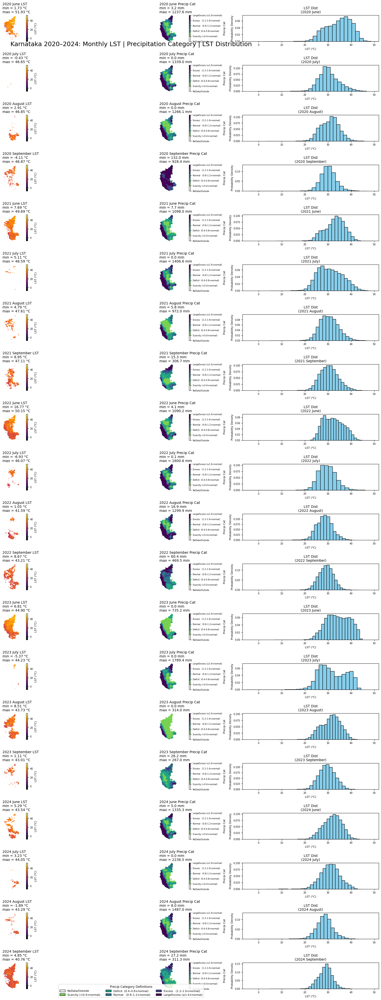

In [42]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust as needed)
#    - LST TIFF:               20 bands (2020–2024 × 4 months: June, July, August, September)
#    - Precipitation RAW TIFF: 25 bands (2020–2024 × 5 bands: June, July, August, September, Total)
#    - Precipitation Category: 25 bands (2020–2024 × 5 category bands)
#
#  For Karnataka, we assume:
#    Karnataka_X_LST.tif
#    Karnataka_Y_Precipitation_CHIRPS.tif
#    Karnataka_Y_Precipitation_GT_geotif.tif
# -----------------------------------------------------------------------------
lst_tiff_path        = "Karnataka_X_LST.tif"
precip_raw_tiff_path = "Karnataka_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff_path = "Karnataka_Y_Precipitation_GT_geotif.tif"

for p in (lst_tiff_path, precip_raw_tiff_path, precip_cat_tiff_path):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Cannot find {p!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ THE 20‐BAND LST TIFF (2020–2024 × 4 months)
# -----------------------------------------------------------------------------
with rasterio.open(lst_tiff_path) as src_lst:
    lst_bands = src_lst.read().astype(np.float32)  # shape = (20, H, W)
    height, width = src_lst.height, src_lst.width

n_lst_bands = lst_bands.shape[0]
if n_lst_bands != 20:
    raise ValueError(f"Expected 20 bands in {lst_tiff_path}, but found {n_lst_bands}")

# -----------------------------------------------------------------------------
# 3) READ THE 25‐BAND RAW PRECIPITATION TIFF (monthly sums in mm)
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff_path) as src_pr_raw:
    precip_raw_full = src_pr_raw.read().astype(np.float32)  # shape = (25, H, W)

n_pr_raw = precip_raw_full.shape[0]
if n_pr_raw != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff_path}, but found {n_pr_raw}")

# -----------------------------------------------------------------------------
# 4) READ THE 25‐BAND PRECIPITATION CATEGORY TIFF (codes -1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff_path) as src_pr_cat:
    precip_cat_full = src_pr_cat.read().astype(np.int8)  # shape = (25, H, W)

n_pr_cat = precip_cat_full.shape[0]
if n_pr_cat != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff_path}, but found {n_pr_cat}")

# -----------------------------------------------------------------------------
# 5) EXTRACT ONLY THE 20 MONTHLY PRECIP BANDS
#    (drop each year's "Total" at indices 4, 9, 14, 19, 24)
# -----------------------------------------------------------------------------
monthly_indices = []
for year_idx in range(5):
    base = year_idx * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

# Now shapes: (20, H, W)
precip_raw_bands = precip_raw_full[monthly_indices, :, :]
precip_cat_bands = precip_cat_full[monthly_indices, :, :]

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS & MONTHS ARRAYS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)       # 5
n_months    = len(month_names) # 4
n_total     = n_years * n_months  # 20

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS & STATISTICS
#    a) LST: continuous "inferno" palette from min to max °C
#    b) Precip category: discrete 6 colors (0..5)
# -----------------------------------------------------------------------------
# 7a) Compute LST vmin/vmax across all 20 bands (ignore NaNs)
all_lst_vals = lst_bands.flatten()
all_lst_vals = all_lst_vals[~np.isnan(all_lst_vals)]
lst_vmin = float(np.nanmin(all_lst_vals)) if all_lst_vals.size else 0.0
lst_vmax = float(np.nanmax(all_lst_vals)) if all_lst_vals.size else 50.0

lst_cmap = plt.get_cmap("inferno")

# 7b) Precip category colormap
cluster_colors = [
    "#ffffff",  # 0 = NoData/Outside   (orig code -1)
    "#79d151",  # 1 = Scarcity         (orig code 0)
    "#22a784",  # 2 = Deficit          (orig code 1)
    "#29788e",  # 3 = Normal           (orig code 2)
    "#404387",  # 4 = Excess           (orig code 3)
    "#440154"   # 5 = LargeExcess      (orig code 4)
]
cluster_cmap = ListedColormap(cluster_colors)
cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 8) BUILD FIGURE: 20 ROWS × 3 COLUMNS
#    Columns: [0]=LST map, [1]=Precip Category map, [2]=LST distribution histogram
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_total,
    ncols=3,
    figsize=(20, n_total * 2.0),
    constrained_layout=True
)
fig.suptitle(
    "Karnataka 2020–2024: Monthly LST | Precipitation Category | LST Distribution\n",
    fontsize=18, y=0.96
)

# If only one row, expand dims
if n_total == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 9) LOOP OVER ALL 20 MONTHLY BANDS (i = 0..19)
# -----------------------------------------------------------------------------
for i in range(n_total):
    yr_idx  = i // n_months
    mo_idx  = i % n_months
    year    = years[yr_idx]
    month   = month_names[mo_idx]
    
    # --- a) LST layer & stats (°C) ---
    lst_layer = lst_bands[i]
    valid_lst = lst_layer[~np.isnan(lst_layer)]
    if valid_lst.size > 0:
        lst_min = float(np.nanmin(valid_lst))
        lst_max = float(np.nanmax(valid_lst))
    else:
        lst_min = np.nan
        lst_max = np.nan
    
    # --- b) Precip raw layer & stats (mm) ---
    pr_layer = precip_raw_bands[i]
    valid_pr = pr_layer[~np.isnan(pr_layer)]
    if valid_pr.size > 0:
        pr_min = float(np.nanmin(valid_pr))
        pr_max = float(np.nanmax(valid_pr))
    else:
        pr_min = np.nan
        pr_max = np.nan
    
    # --- c) Precip category (shift -1..4 → 0..5) ---
    raw_cat = precip_cat_bands[i]  # values in {-1,0,1,2,3,4}
    cat_plot = np.full(raw_cat.shape, 0, dtype=np.int8)
    mask_valid = (raw_cat != -1)
    cat_plot[mask_valid] = raw_cat[mask_valid] + 1  # now in {1..5}
    
    # ----- Column 0: LST Map -----
    ax0 = axes[i, 0]
    im0 = ax0.imshow(
        lst_layer,
        cmap=lst_cmap,
        vmin=lst_vmin,
        vmax=lst_vmax
    )
    ax0.set_title(
        f"{year} {month} LST\nmin = {lst_min:.2f} °C\nmax = {lst_max:.2f} °C",
        fontsize=10,
        loc="left"
    )
    ax0.axis("off")
    
    cbar0 = fig.colorbar(
        im0,
        ax=ax0,
        orientation="vertical",
        fraction=0.04,
        pad=0.04
    )
    cbar0.set_label("LST (°C)", fontsize=8)
    cbar0.ax.tick_params(labelsize=7)
    
    # ----- Column 1: Precip Category Map -----
    ax1 = axes[i, 1]
    im1 = ax1.imshow(
        cat_plot,
        cmap=cluster_cmap,
        vmin=0,
        vmax=5
    )
    ax1.set_title(
        f"{year} {month} Precip Cat\nmin = {pr_min:.1f} mm\nmax = {pr_max:.1f} mm",
        fontsize=10,
        loc="left"
    )
    ax1.axis("off")
    
    cbar1 = fig.colorbar(
        im1,
        ax=ax1,
        orientation="vertical",
        fraction=0.04,
        pad=0.04
    )
    cbar1.set_ticks([0, 1, 2, 3, 4, 5])
    cbar1.set_ticklabels([
        cluster_labels[0],
        cluster_labels[1],
        cluster_labels[2],
        cluster_labels[3],
        cluster_labels[4],
        cluster_labels[5]
    ])
    cbar1.ax.tick_params(labelsize=6)
    cbar1.set_label("Precip Cat", fontsize=8)
    
    # ----- Column 2: LST Distribution Histogram -----
    ax2 = axes[i, 2]
    if valid_lst.size > 0:
        ax2.hist(
            valid_lst.flatten(),
            bins=30,
            density=True,
            edgecolor="black",
            color="skyblue"
        )
        ax2.set_xlim(lst_vmin, lst_vmax)
    else:
        ax2.text(
            0.5, 0.5, "No Data",
            horizontalalignment='center',
            verticalalignment='center',
            fontsize=8,
            color='gray'
        )
    ax2.set_title(
        f"LST Dist\n({year} {month})",
        fontsize=10
    )
    ax2.set_xlabel("LST (°C)", fontsize=8)
    ax2.set_ylabel("Probability Density", fontsize=8)
    ax2.tick_params(axis="both", labelsize=7)

# -----------------------------------------------------------------------------
# 10) ADD A LEGEND FOR PRECIPITATION CATEGORIES AT BOTTOM CENTER
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Precip Category Definitions",
    bbox_to_anchor=(0.5, 0.00),
    fontsize=8,
    title_fontsize=9
)

plt.show()


In [ ]:
##Karnataka_X_NVDI

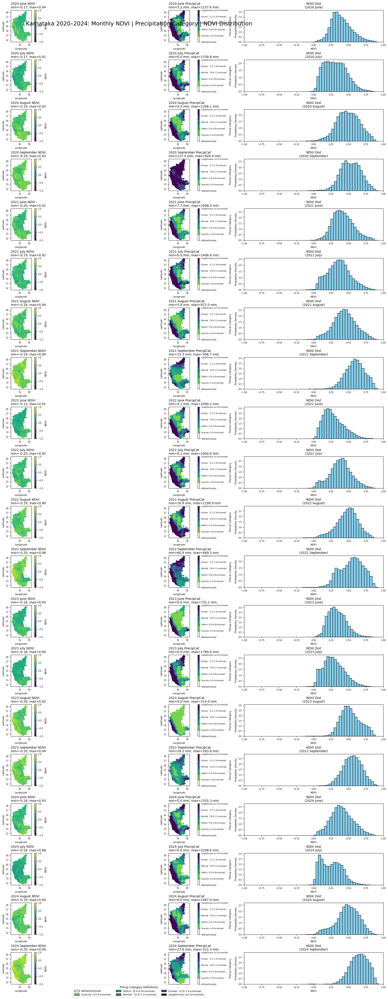

In [71]:
import os
import rasterio
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from rasterio.features import geometry_mask

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
# -----------------------------------------------------------------------------
ndvi_tiff_path       = "Karnataka_X_NDVI.tif"
precip_raw_tiff_path = "Karnataka_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff_path = "Karnataka_Y_Precipitation_GT_geotif.tif"
india_shapefile      = "SateMask/gadm41_IND_1.shp"  # contains Karnataka polygon

for path in (ndvi_tiff_path, precip_raw_tiff_path, precip_cat_tiff_path, india_shapefile):
    if not os.path.isfile(path):
        raise FileNotFoundError(f"Cannot find {path!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ & MASK THE 20-BAND NDVI TIFF (2020–2024 × 4 months)
# -----------------------------------------------------------------------------
with rasterio.open(ndvi_tiff_path) as src_nd:
    ndvi_bands     = src_nd.read().astype(np.float32)  # shape = (20, ndvi_height, ndvi_width)
    ndvi_transform = src_nd.transform
    ndvi_crs       = src_nd.crs
    ndvi_height, ndvi_width = src_nd.height, src_nd.width
    bounds         = src_nd.bounds

n_ndvi_bands = ndvi_bands.shape[0]
if n_ndvi_bands != 20:
    raise ValueError(f"Expected 20 bands in {ndvi_tiff_path}, but found {n_ndvi_bands}")

# 2a) Load India shapefile, extract Karnataka, reproject to NDVI CRS if needed
gdf = gpd.read_file(india_shapefile)
gdf_karnataka = gdf[gdf["NAME_1"].str.lower() == "karnataka"].copy()
if gdf_karnataka.empty:
    raise ValueError("No feature named 'Karnataka' found in shapefile.")

if gdf_karnataka.crs != ndvi_crs:
    gdf_karnataka = gdf_karnataka.to_crs(ndvi_crs)

# 2b) Union of Karnataka geometry
karnataka_geom = [gdf_karnataka.geometry.union_all()]

# 2c) Build NDVI mask (True = inside Karnataka)
karnataka_mask = geometry_mask(
    karnataka_geom,
    transform=ndvi_transform,
    invert=True,
    out_shape=(ndvi_height, ndvi_width)
)

# 2d) Set NDVI pixels outside Karnataka → NaN
for i in range(n_ndvi_bands):
    band = ndvi_bands[i]
    band[~karnataka_mask] = np.nan
    ndvi_bands[i] = band

# -----------------------------------------------------------------------------
# 3) READ THE 25-BAND RAW PRECIPITATION TIFF (in mm) & BUILD A SEPARATE MASK
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff_path) as src_pr_raw:
    precip_raw_full = src_pr_raw.read().astype(np.float32)  # shape = (25, pr_height, pr_width)
    pr_transform     = src_pr_raw.transform
    pr_crs           = src_pr_raw.crs
    pr_height, pr_width = src_pr_raw.height, src_pr_raw.width

n_pr_raw_bands = precip_raw_full.shape[0]
if n_pr_raw_bands != 25:
    raise ValueError(
        f"Expected 25 bands in {precip_raw_tiff_path}, but found {n_pr_raw_bands}"
    )

# 3a) Reproject Karnataka geometry to precipitation CRS (if needed)
if gdf_karnataka.crs != pr_crs:
    gdf_karnataka_pr = gdf_karnataka.to_crs(pr_crs)
else:
    gdf_karnataka_pr = gdf_karnataka

karnataka_geom_pr = [gdf_karnataka_pr.geometry.union_all()]

# Build precipitation-mask (True = inside Karnataka) on the precipitation grid
karnataka_mask_pr = geometry_mask(
    karnataka_geom_pr,
    transform=pr_transform,
    invert=True,
    out_shape=(pr_height, pr_width)
)

# 3b) Mask raw precipitation outside Karnataka → NaN
for i in range(n_pr_raw_bands):
    arr = precip_raw_full[i]          # shape = (pr_height, pr_width)
    arr[~karnataka_mask_pr] = np.nan   # now mask and array share the same dims
    precip_raw_full[i] = arr

# -----------------------------------------------------------------------------
# 4) READ THE 25-BAND PRECIPITATION CATEGORY TIFF (codes –1..4) & MASK
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff_path) as src_pr_cat:
    precip_cat_full = src_pr_cat.read().astype(np.int8)  # shape = (25, cat_height, cat_width)
    cat_transform = src_pr_cat.transform
    cat_crs       = src_pr_cat.crs
    cat_height, cat_width = src_pr_cat.height, src_pr_cat.width

n_pr_cat_bands = precip_cat_full.shape[0]
if n_pr_cat_bands != 25:
    raise ValueError(
        f"Expected 25 bands in {precip_cat_tiff_path}, but found {n_pr_cat_bands}"
    )

# 4a) Reproject Karnataka geometry to category-raster CRS (if needed)
if gdf_karnataka.crs != cat_crs:
    gdf_karnataka_cat = gdf_karnataka.to_crs(cat_crs)
else:
    gdf_karnataka_cat = gdf_karnataka

karnataka_geom_cat = [gdf_karnataka_cat.geometry.union_all()]

# Build category-mask on the category grid
karnataka_mask_cat = geometry_mask(
    karnataka_geom_cat,
    transform=cat_transform,
    invert=True,
    out_shape=(cat_height, cat_width)
)

# 4b) Mask precip categories outside Karnataka → code = –1
for i in range(n_pr_cat_bands):
    arr = precip_cat_full[i]          # shape = (cat_height, cat_width)
    arr[~karnataka_mask_cat] = -1
    precip_cat_full[i] = arr

# -----------------------------------------------------------------------------
# 5) EXTRACT THE 20 MONTHLY PRECIPITATION BANDS
#    (drop each year’s “Total” at indices 4, 9, 14, 19, 24)
# -----------------------------------------------------------------------------
monthly_indices = []
for yr_idx in range(5):
    base = yr_idx * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

precip_raw_bands = precip_raw_full[monthly_indices, :, :]  # shape = (20, pr_height, pr_width)
precip_cat_bands = precip_cat_full[monthly_indices, :, :]  # shape = (20, cat_height, cat_width)

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS & MONTHS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)       # 5
n_months    = len(month_names) # 4
n_total     = n_years * n_months  # 20

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS & STATISTICS FOR PLOTTING
# -----------------------------------------------------------------------------
# 7a) NDVI colormap: continuous “viridis” from –1 to 1
ndvi_cmap = plt.get_cmap("viridis")
ndvi_vmin, ndvi_vmax = -1.0, 1.0

# 7b) Precipitation category palette (0..5 after shifting)
cluster_colors = [
    "#ffffff",  # 0 = NoData/Outside (orig code -1)
    "#79d151",  # 1 = Scarcity      (orig code  0)
    "#22a784",  # 2 = Deficit       (orig code  1)
    "#29788e",  # 3 = Normal        (orig code  2)
    "#404387",  # 4 = Excess        (orig code  3)
    "#440154"   # 5 = LargeExcess   (orig code  4)
]
cluster_cmap = ListedColormap(cluster_colors)
cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 8) BUILD FIGURE: 20 ROWS × 3 COLUMNS
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_total,
    ncols=3,
    figsize=(22, n_total * 2.2),  # Each row ~2.2" tall → total ~44"
    constrained_layout=True
)
fig.suptitle(
    "Karnataka 2020–2024: Monthly NDVI | Precipitation Category | NDVI Distribution",
    fontsize=18, y=0.98
)

# If single row, force axes to 2D
if n_total == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 9) LOOP OVER ALL 20 MONTHS (i = 0..19)
# -----------------------------------------------------------------------------
for i in range(n_total):
    yr_idx  = i // n_months
    mo_idx  = i % n_months
    year    = years[yr_idx]
    month   = month_names[mo_idx]

    # --- NDVI layer & min/max (–1..1) ---
    ndvi_layer = ndvi_bands[i]
    valid_ndvi = ndvi_layer[~np.isnan(ndvi_layer)]
    if valid_ndvi.size > 0:
        ndvi_min = float(np.nanmin(valid_ndvi))
        ndvi_max = float(np.nanmax(valid_ndvi))
    else:
        ndvi_min = ndvi_max = None

    # --- Raw precipitation layer & min/max (in mm) ---
    raw_pr_layer = precip_raw_bands[i]
    valid_pr = raw_pr_layer[~np.isnan(raw_pr_layer)]
    if valid_pr.size > 0:
        pr_min = float(np.nanmin(valid_pr))
        pr_max = float(np.nanmax(valid_pr))
    else:
        pr_min = pr_max = None

    # --- Precip category (orig –1..4 → plot as 0..5) ---
    raw_clust = precip_cat_bands[i]  # values in {–1,0,1,2,3,4}
    cluster_plot = np.full(raw_clust.shape, 0, dtype=np.int8)
    mask_valid = (raw_clust != -1)
    cluster_plot[mask_valid] = raw_clust[mask_valid] + 1  # now {1..5}

    # ----- Column 0: NDVI Map -----
    ax0 = axes[i, 0]
    im0 = ax0.imshow(
        ndvi_layer,
        cmap=ndvi_cmap,
        vmin=ndvi_vmin,
        vmax=ndvi_vmax,
        extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
        origin="upper"
    )
    title0 = f"{year} {month} NDVI"
    if ndvi_min is not None and ndvi_max is not None:
        title0 += f"\nmin={ndvi_min:.2f}, max={ndvi_max:.2f}"
    ax0.set_title(title0, fontsize=10, loc="left")
    ax0.set_xlabel("Longitude", fontsize=8)
    ax0.set_ylabel("Latitude", fontsize=8)
    ax0.tick_params(labelsize=7)

    cbar0 = fig.colorbar(
        im0,
        ax=ax0,
        orientation="vertical",
        fraction=0.045,
        pad=0.02
    )
    cbar0.set_label("NDVI", fontsize=8)
    cbar0.ax.tick_params(labelsize=7)

    # ----- Column 1: Precipitation Category Map -----
    ax1 = axes[i, 1]
    im1 = ax1.imshow(
        cluster_plot,
        cmap=cluster_cmap,
        vmin=0,
        vmax=5,
        extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
        origin="upper"
    )
    title1 = f"{year} {month} PrecipCat"
    if pr_min is not None and pr_max is not None:
        title1 += f"\nmin={pr_min:.1f} mm, max={pr_max:.1f} mm"
    ax1.set_title(title1, fontsize=10, loc="left")
    ax1.set_xlabel("Longitude", fontsize=8)
    ax1.set_ylabel("Latitude", fontsize=8)
    ax1.tick_params(labelsize=7)

    cbar1 = fig.colorbar(
        im1,
        ax=ax1,
        orientation="vertical",
        fraction=0.045,
        pad=0.02
    )
    cbar1.set_ticks([0, 1, 2, 3, 4, 5])
    cbar1.set_ticklabels([
        cluster_labels[0],
        cluster_labels[1],
        cluster_labels[2],
        cluster_labels[3],
        cluster_labels[4],
        cluster_labels[5]
    ], fontsize=6)
    cbar1.ax.tick_params(labelsize=6)
    cbar1.set_label("Precip Category", fontsize=8)

    # ----- Column 2: NDVI Distribution (Histogram) -----
    ax2 = axes[i, 2]
    if valid_ndvi.size > 0:
        ax2.hist(
            valid_ndvi.flatten(),
            bins=30,
            density=True,
            edgecolor="black",
            color="skyblue"
        )
        ax2.set_xlim(ndvi_vmin, ndvi_vmax)
    else:
        ax2.text(
            0.5, 0.5, "No Data",
            horizontalalignment='center',
            verticalalignment='center',
            fontsize=8,
            color='gray'
        )
    ax2.set_title(f"NDVI Dist\n({year} {month})", fontsize=10)
    ax2.set_xlabel("NDVI", fontsize=8)
    ax2.set_ylabel("Probability Density", fontsize=8)
    ax2.tick_params(axis="both", labelsize=7)

# -----------------------------------------------------------------------------
# 10) Legend for Precipitation Categories at bottom center
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Precip Category Definitions",
    bbox_to_anchor=(0.5, -0.005),
    fontsize=8,
    title_fontsize=9
)

plt.show()


In [ ]:
##Karnataka_X_Relative_Humidity

In [ ]:
// --------------------------------------------------------------------------------
// Compute Monthly‐Mean Relative Humidity for Karnataka (June–September, 2020–2024)
// using ERA5‐Land Hourly data. Stack all 20 months into one 20‐band GeoTIFF
// named “Karnataka_X_Relative_Humidity.tif”.
// --------------------------------------------------------------------------------

// 0. Load Indian states boundary and filter for Karnataka
var states    = ee.FeatureCollection("FAO/GAUL/2015/level1");
var karnataka = states.filter(ee.Filter.eq('ADM1_NAME', 'Karnataka'));
Map.centerObject(karnataka, 7);
Map.addLayer(karnataka, { color: 'black' }, 'Karnataka Boundary');

// 1. Define the years (2020–2024) and monsoon months (June–September)
var years      = [2020, 2021, 2022, 2023, 2024];
var months     = [6, 7, 8, 9];
var monthNames = ['June', 'July', 'August', 'September'];

// 2. Define visualization parameters for Relative Humidity (0–100%)
//    with an eight‐color reversed palette (very high RH → red down to blue)
var visRH = {
  min: 0,
  max: 100,
  palette: [
    'red',       // very high RH
    'orange',
    'yellow',
    'white',
    'green',
    'cyan',
    'lightblue',
    'blue'       // very low RH
  ]
};

// 3. Function to compute daily RH from ERA5‐Land fields
function computeDailyRH(image) {
  // Select 2 m air temperature and 2 m dewpoint (both in Kelvin)
  var t2m  = image.select('temperature_2m');
  var td2m = image.select('dewpoint_temperature_2m');
  // Convert to Celsius
  var T  = t2m.subtract(273.15);
  var Td = td2m.subtract(273.15);
  // Magnus–Teten constants
  var a = 17.625;
  var b = 243.04;
  // e_s(Td) = exp((a * Td) / (b + Td))
  var eTd = Td.multiply(a).divide(Td.add(b)).exp();
  // e_s(T)  = exp((a * T) / (b + T))
  var eT  = T.multiply(a).divide(T.add(b)).exp();
  // RH = 100 * (eTd / eT)
  var rh = eTd.divide(eT).multiply(100).rename('RH');
  return rh.copyProperties(image, image.propertyNames());
}

// 4. Loop over each year & month to compute monthly‐mean RH
var allBands = [];

years.forEach(function(year) {
  months.forEach(function(m, idx) {
    // 4.1 Define start and end dates for this month
    var start = ee.Date.fromYMD(year, m, 1);
    var end   = start.advance(1, 'month');

    // 4.2 Filter ERA5‐Land Hourly to this month & region, compute daily RH
    var era5Daily = ee.ImageCollection('ECMWF/ERA5_LAND/HOURLY')
                       .filterDate(start, end)
                       .filterBounds(karnataka)
                       .select(['temperature_2m', 'dewpoint_temperature_2m'])
                       .map(computeDailyRH)
                       .select('RH');  // keep only the RH band

    // 4.3 Compute the monthly mean RH, clip to Karnataka, rename band
    var monthlyRH = era5Daily
                      .mean()
                      .clip(karnataka)
                      .rename(year + '_' + monthNames[idx] + '_RH');

    allBands.push(monthlyRH);

    // 4.4 Visualize each monthly RH on the map
    Map.addLayer(
      monthlyRH,
      visRH,
      year + ' ' + monthNames[idx] + ' RH (%)'
    );
  });
});

// 5. Stack all 20 monthly RH bands into one multi‐band image
var rhMultiband = ee.Image.cat(allBands);

// 6. Export the 20‐band RH image to Google Drive
Export.image.toDrive({
  image:          rhMultiband,
  description:    'Karnataka_X_Relative_Humidity',  // Task name
  folder:         'GEE_Exports',                    // Drive folder
  fileNamePrefix: 'Karnataka_X_Relative_Humidity',  // Output → “Karnataka_X_Relative_Humidity.tif”
  region:         karnataka.geometry(),             // Clip to Karnataka boundary
  scale:          1000,                             // 1 km resolution
  crs:            'EPSG:4326',
  maxPixels:      1e13
});



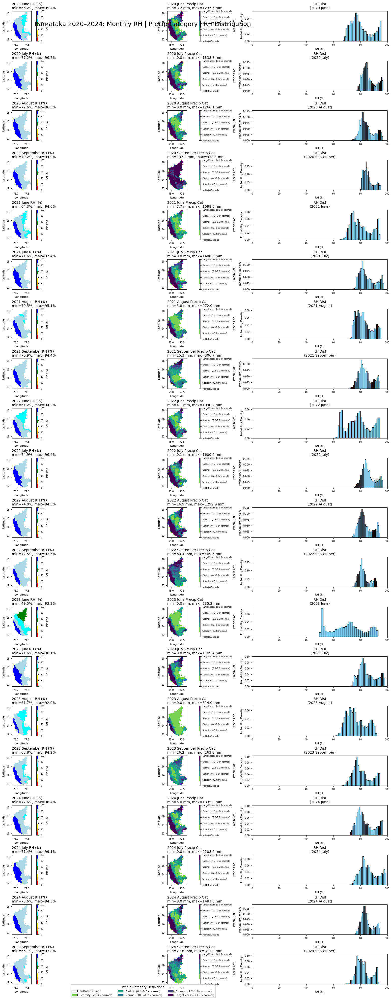

In [78]:
import os
import rasterio
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from rasterio.features import geometry_mask

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
# -----------------------------------------------------------------------------
#  - Relative Humidity TIFF:       20 bands (June–Sept 2020–2024)
#  - Raw Precipitation TIFF:       25 bands (2020–2024 × 5: Jun, Jul, Aug, Sep, Total)
#  - Precipitation Category TIFF:  25 bands (2020–2024 × 5 category bands)
#  - Karnataka mask shapefile:     "SateMask/gadm41_IND_1.shp"  (contains all Indian states)
# -----------------------------------------------------------------------------
rh_tiff_path        = "Karnataka_X_Relative_Humidity.tif"
precip_raw_tiff     = "Karnataka_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff     = "Karnataka_Y_Precipitation_GT_geotif.tif"
india_shapefile     = "SateMask/gadm41_IND_1.shp"

for path in (rh_tiff_path, precip_raw_tiff, precip_cat_tiff, india_shapefile):
    if not os.path.isfile(path):
        raise FileNotFoundError(f"Cannot find {path!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ & MASK THE 20‐BAND RELATIVE HUMIDITY TIFF
# -----------------------------------------------------------------------------
with rasterio.open(rh_tiff_path) as src_rh:
    rh_bands      = src_rh.read().astype(np.float32)  # shape = (20, H, W)
    rh_transform  = src_rh.transform
    rh_crs        = src_rh.crs
    height, width = src_rh.height, src_rh.width
    rh_bounds     = src_rh.bounds

n_rh_bands = rh_bands.shape[0]
if n_rh_bands != 20:
    raise ValueError(f"Expected 20 bands in {rh_tiff_path}, but found {n_rh_bands}")

# 2a) Load Karnataka from the shapefile and reproject to match RH CRS
gdf = gpd.read_file(india_shapefile)
gdf_kar = gdf[gdf["NAME_1"].str.lower() == "karnataka"].copy()
if gdf_kar.empty:
    raise ValueError("No feature named 'Karnataka' found in shapefile.")

if gdf_kar.crs != rh_crs:
    gdf_kar = gdf_kar.to_crs(rh_crs)

# 2b) Build a single unioned geometry for Karnataka to mask
kar_geom = [gdf_kar.geometry.union_all()]

# 2c) Create a boolean mask where True = inside Karnataka
kar_mask = geometry_mask(
    kar_geom,
    transform=rh_transform,
    invert=True,
    out_shape=(height, width)
)

# 2d) Set RH pixels outside Karnataka → NaN
for i in range(n_rh_bands):
    band = rh_bands[i]
    band[~kar_mask] = np.nan
    rh_bands[i] = band

# -----------------------------------------------------------------------------
# 3) READ & MASK THE 25‐BAND RAW PRECIPITATION TIFF (in mm)
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff) as src_pr:
    pr_raw_full = src_pr.read().astype(np.float32)  # shape = (25, H, W)

n_pr_raw = pr_raw_full.shape[0]
if n_pr_raw != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff}, but found {n_pr_raw}")

# 3a) Mask raw precipitation outside Karnataka → NaN
for i in range(n_pr_raw):
    arr = pr_raw_full[i]
    arr[~kar_mask] = np.nan
    pr_raw_full[i] = arr

# -----------------------------------------------------------------------------
# 4) READ & MASK THE 25‐BAND PRECIPITATION CATEGORY TIFF (codes -1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff) as src_pc:
    pr_cat_full = src_pc.read().astype(np.int8)  # shape = (25, H, W)

n_pr_cat = pr_cat_full.shape[0]
if n_pr_cat != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff}, but found {n_pr_cat}")

# 4a) Mask precipitation categories outside Karnataka → code = -1
for i in range(n_pr_cat):
    arr = pr_cat_full[i]
    arr[~kar_mask] = -1
    pr_cat_full[i] = arr

# -----------------------------------------------------------------------------
# 5) EXTRACT THE 20 MONTHLY PRECIP BANDS
#    (drop each year's “Total” at indices 4, 9, 14, 19, 24)
# -----------------------------------------------------------------------------
monthly_indices = []
for y in range(5):
    base = y * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

pr_raw_bands = pr_raw_full[monthly_indices, :, :]
pr_cat_bands = pr_cat_full[monthly_indices, :, :]

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS & MONTHS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)
n_months    = len(month_names)
n_total     = n_years * n_months  # 20

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS & GLOBAL STATISTICS
# -----------------------------------------------------------------------------
# 7a) Relative Humidity colormap (8-step reversed red→blue)
rh_palette = ["red","orange","yellow","white","green","cyan","lightblue","blue"]
rh_cmap    = ListedColormap(rh_palette)
rh_vmin, rh_vmax = 0, 100  # RH in %

# 7b) Precipitation category palette (0..5 after shifting -1..4)
cluster_colors = [
    "#ffffff","#79d151","#22a784","#29788e","#404387","#440154"
]
cluster_cmap = ListedColormap(cluster_colors)
cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# 7c) Global min/max of raw precipitation (mm), ignoring NaNs
all_pr = pr_raw_bands.flatten()
all_pr = all_pr[~np.isnan(all_pr)]
pr_vmin = float(np.nanmin(all_pr)) if all_pr.size else 0.0
pr_vmax = float(np.nanmax(all_pr)) if all_pr.size else 0.0

# -----------------------------------------------------------------------------
# 8) CREATE THE FIGURE: 20 ROWS × 3 COLUMNS (one row per month)
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_total, ncols=3,
    figsize=(20, n_total * 2.0),
    constrained_layout=True
)
fig.suptitle(
    "Karnataka 2020–2024: Monthly RH | Precip Category | RH Distribution",
    fontsize=18, y=0.98
)

if n_total == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 9) LOOP OVER ALL 20 MONTHS (i = 0..19)
# -----------------------------------------------------------------------------
for i in range(n_total):
    yr_idx = i // n_months
    mo_idx = i % n_months
    year   = years[yr_idx]
    month  = month_names[mo_idx]

    # (a) RH layer + stats
    rh_layer = rh_bands[i]
    vrh = rh_layer[~np.isnan(rh_layer)]
    rh_min, rh_max = (float(np.nanmin(vrh)), float(np.nanmax(vrh))) if vrh.size else (None, None)

    # (b) Precip raw + stats
    pr_layer = pr_raw_bands[i]
    vpr = pr_layer[~np.isnan(pr_layer)]
    pr_min, pr_max = (float(np.nanmin(vpr)), float(np.nanmax(vpr))) if vpr.size else (None, None)

    # (c) Precip category shifted
    cat = pr_cat_bands[i]
    cat_plot = np.full(cat.shape, 0, np.int8)
    mask = (cat != -1)
    cat_plot[mask] = cat[mask] + 1

    # --- Col 0: RH Map ---
    ax0 = axes[i, 0]
    im0 = ax0.imshow(
        rh_layer, cmap=rh_cmap, vmin=rh_vmin, vmax=rh_vmax,
        extent=[rh_bounds.left, rh_bounds.right, rh_bounds.bottom, rh_bounds.top],
        origin="upper"
    )
    title0 = f"{year} {month} RH (%)"
    if rh_min is not None:
        title0 += f"\nmin={rh_min:.1f}%, max={rh_max:.1f}%"
    ax0.set_title(title0, loc="left", fontsize=10)
    ax0.set_xlabel("Longitude", fontsize=8)
    ax0.set_ylabel("Latitude", fontsize=8)
    ax0.tick_params(labelsize=7)
    cbar0 = fig.colorbar(im0, ax=ax0, fraction=0.045, pad=0.02)
    cbar0.set_label("RH (%)", fontsize=8)
    cbar0.ax.tick_params(labelsize=6)

    # --- Col 1: Precip Category Map ---
    ax1 = axes[i, 1]
    im1 = ax1.imshow(
        cat_plot, cmap=cluster_cmap, vmin=0, vmax=5,
        extent=[rh_bounds.left, rh_bounds.right, rh_bounds.bottom, rh_bounds.top],
        origin="upper"
    )
    title1 = f"{year} {month} Precip Cat"
    if pr_min is not None:
        title1 += f"\nmin={pr_min:.1f} mm, max={pr_max:.1f} mm"
    ax1.set_title(title1, loc="left", fontsize=10)
    ax1.set_xlabel("Longitude", fontsize=8)
    ax1.set_ylabel("Latitude", fontsize=8)
    ax1.tick_params(labelsize=7)
    cbar1 = fig.colorbar(im1, ax=ax1, fraction=0.045, pad=0.02)
    cbar1.set_ticks([0,1,2,3,4,5])
    cbar1.set_ticklabels([cluster_labels[i] for i in range(6)], fontsize=6)
    cbar1.ax.tick_params(labelsize=6)
    cbar1.set_label("Precip Cat", fontsize=8)

    # --- Col 2: RH Distribution Histogram ---
    ax2 = axes[i, 2]
    if vrh.size:
        ax2.hist(vrh.flatten(), bins=30, density=True, edgecolor="black", color="skyblue")
        ax2.set_xlim(rh_vmin, rh_vmax)
    else:
        ax2.text(0.5,0.5,"No Data",ha="center",va="center",fontsize=8,color="gray")
    ax2.set_title(f"RH Dist\n({year} {month})", fontsize=10)
    ax2.set_xlabel("RH (%)", fontsize=8)
    ax2.set_ylabel("Probability Density", fontsize=8)
    ax2.tick_params(labelsize=7)

# -----------------------------------------------------------------------------
# 10) Legend for Precipitation Categories at bottom center
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Precip Category Definitions",
    bbox_to_anchor=(0.5, -0.005),
    fontsize=8,
    title_fontsize=9
)

plt.show()


In [ ]:
##Karnataka_X_Wind_Speed

In [ ]:
// --------------------------------------------------------------------------------
// Compute Monthly‐Mean Wind Speed for Karnataka (June–September, 2020–2024)
// using ERA5‐Land Hourly data (“ECMWF/ERA5_LAND/HOURLY”). We will produce
// 5 years × 4 months = 20 single-band images, stack them into a single 20-band
// GeoTIFF, and export as “Karnataka_X_Wind_Speed.tif”.
// --------------------------------------------------------------------------------

// 1. Load Karnataka boundary from GAUL level1 and display it
var states     = ee.FeatureCollection("FAO/GAUL/2015/level1");
var karnataka  = states.filter(ee.Filter.eq('ADM1_NAME', 'Karnataka'));
Map.centerObject(karnataka, 7);
Map.addLayer(karnataka, { color: 'black' }, 'Karnataka Boundary');

// 2. Define the years (2020–2024) and monsoon months (June–September)
var years      = [2020, 2021, 2022, 2023, 2024];
var months     = [6, 7, 8, 9];
var monthNames = ['June', 'July', 'August', 'September'];

// 3. Build a list of single-band wind-speed images (one per year & month)
var allBands = [];

// 3a. Loop over each year
years.forEach(function(year) {
  // 3b. Loop over each monsoon month
  months.forEach(function(m, idx) {
    // 3b.1 Define start/end dates for this month
    var start = ee.Date.fromYMD(year, m, 1);
    var end   = start.advance(1, 'month');

    // 3b.2 Load ERA5-Land Hourly data for this month & Karnataka, selecting u & v at 10 m
    var era5 = ee.ImageCollection("ECMWF/ERA5_LAND/HOURLY")
                  .filterDate(start, end)
                  .filterBounds(karnataka)
                  .select(['u_component_of_wind_10m', 'v_component_of_wind_10m']);

    // 3b.3 Compute wind speed = sqrt(u² + v²) for each hourly image
    var windSpeedCollection = era5.map(function(img) {
      var u = img.select('u_component_of_wind_10m');
      var v = img.select('v_component_of_wind_10m');
      return u.pow(2).add(v.pow(2)).sqrt()
               .rename('wind_speed')
               .copyProperties(img, img.propertyNames());
    });

    // 3b.4 Compute monthly mean wind speed, clip to Karnataka, rename band
    var monthlyAvg = windSpeedCollection
                       .mean()
                       .clip(karnataka)
                       .rename(year + '_' + monthNames[idx] + '_Wind');

    // 3b.5 (Optional) Print min/max to the Console for verification
    var stats = monthlyAvg.reduceRegion({
      reducer:    ee.Reducer.minMax(),
      geometry:   karnataka.geometry(),
      scale:      1000,
      bestEffort: true
    });
    print(year + ' ' + monthNames[idx] + ' Wind Speed min/max:', stats);

    // 3b.6 Add this single-band image to the list
    allBands.push(monthlyAvg);

    // 3b.7 (Optional) Visualize each monthly wind-speed layer on the map
    Map.addLayer(
      monthlyAvg,
      {
        min:     0.0,
        max:     8.0,
        palette: ['white', 'cyan', 'blue', 'purple']
      },
      year + ' ' + monthNames[idx] + ' Wind Speed (m/s)'
    );
  });
});

// 4. Stack all 20 monthly bands into one multi-band image
var windMultiband = ee.Image.cat(allBands);

// 5. Export the 20-band wind-speed image to Google Drive
Export.image.toDrive({
  image:          windMultiband,
  description:    'Karnataka_X_Wind_Speed',    // Task name (no spaces)
  folder:         'GEE_Exports',               // Drive folder
  fileNamePrefix: 'Karnataka_X_Wind_Speed',    // Output → “Karnataka_X_Wind_Speed.tif”
  region:         karnataka.geometry(),        // Clip to Karnataka boundary
  scale:          1000,                        // 1 km resolution
  crs:            'EPSG:4326',
  maxPixels:      1e13
});


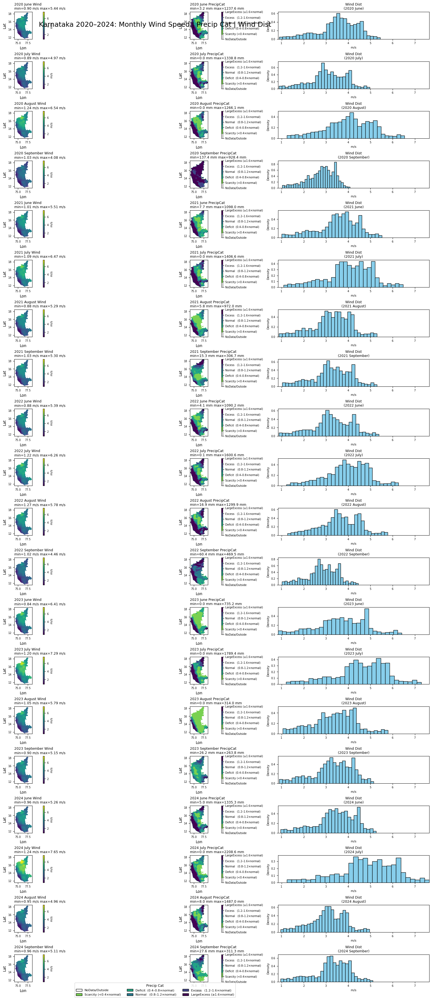

In [82]:
import os
import rasterio
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from rasterio.features import geometry_mask

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
#    - Wind Speed TIFF:       20 bands (2020–2024 × 4 months: June, July, August, September)
#    - Raw Precip TIFF:       25 bands (2020–2024 × 5: Jun, Jul, Aug, Sep, Total)
#    - Precip Category TIFF:  25 bands (same order, codes –1..4)
#    - Karnataka shapefile:   "SateMask/gadm41_IND_1.shp" (vector mask of all Indian states)
# -----------------------------------------------------------------------------
wind_tiff_path        = "Karnataka_X_Wind_Speed.tif"
precip_raw_tiff_path  = "Karnataka_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff_path  = "Karnataka_Y_Precipitation_GT_geotif.tif"
india_shapefile       = "SateMask/gadm41_IND_1.shp"

for p in (wind_tiff_path, precip_raw_tiff_path, precip_cat_tiff_path, india_shapefile):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Cannot find {p!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ & MASK THE 20‐BAND WIND SPEED TIFF
# -----------------------------------------------------------------------------
with rasterio.open(wind_tiff_path) as src_wind:
    wind_bands     = src_wind.read().astype(np.float32)  # (20, H, W)
    wind_transform = src_wind.transform
    wind_crs       = src_wind.crs
    height, width  = src_wind.height, src_wind.width
    bounds         = src_wind.bounds

if wind_bands.shape[0] != 20:
    raise ValueError(f"Expected 20 bands in {wind_tiff_path}, found {wind_bands.shape[0]}")

# 2a) Load Karnataka polygon & reproject to wind CRS
gdf = gpd.read_file(india_shapefile)
gdf_kar = gdf[gdf["NAME_1"].str.lower()=="karnataka"].copy()
if gdf_kar.empty:
    raise ValueError("No feature named 'Karnataka' found in shapefile.")
if gdf_kar.crs != wind_crs:
    gdf_kar = gdf_kar.to_crs(wind_crs)

kar_geom = [gdf_kar.geometry.union_all()]

# 2b) Mask = True inside Karnataka
kar_mask = geometry_mask(
    kar_geom, transform=wind_transform, invert=True,
    out_shape=(height, width)
)

# 2c) Apply mask → NaN outside
for i in range(20):
    band = wind_bands[i]
    band[~kar_mask] = np.nan
    wind_bands[i] = band

# -----------------------------------------------------------------------------
# 3) READ & MASK THE 25‐BAND RAW PRECIPITATION TIFF (mm)
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff_path) as src_pr:
    pr_raw_full = src_pr.read().astype(np.float32)  # (25, H, W)

if pr_raw_full.shape[0] != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff_path}, found {pr_raw_full.shape[0]}")

for i in range(25):
    arr = pr_raw_full[i]
    arr[~kar_mask] = np.nan
    pr_raw_full[i] = arr

# -----------------------------------------------------------------------------
# 4) READ & MASK THE 25‐BAND PRECIPITATION CATEGORY TIFF (codes –1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff_path) as src_pc:
    pr_cat_full = src_pc.read().astype(np.int8)  # (25, H, W)

if pr_cat_full.shape[0] != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff_path}, found {pr_cat_full.shape[0]}")

for i in range(25):
    arr = pr_cat_full[i]
    arr[~kar_mask] = -1
    pr_cat_full[i] = arr

# -----------------------------------------------------------------------------
# 5) EXTRACT 20 MONTHLY PRECIP BANDS (drop totals at idx 4,9,14,19,24)
# -----------------------------------------------------------------------------
monthly_idxs = []
for y in range(5):
    base = 5*y
    monthly_idxs += [base, base+1, base+2, base+3]

pr_raw_bands = pr_raw_full[monthly_idxs]  # (20, H, W)
pr_cat_bands = pr_cat_full[monthly_idxs]  # (20, H, W)

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS & MONTHS ARRAYS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June","July","August","September"]
n_months    = len(month_names)
n_total     = len(years)*n_months  # 20

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS & GLOBAL STATISTICS
# -----------------------------------------------------------------------------
# 7a) Wind speed range & colormap
ws_vals = wind_bands.flatten()
ws_vals = ws_vals[~np.isnan(ws_vals)]
wind_vmin = float(np.nanmin(ws_vals)) if ws_vals.size else 0.0
wind_vmax = float(np.nanmax(ws_vals)) if ws_vals.size else 1.0
wind_cmap = plt.get_cmap("viridis")

# 7b) Precip category palette
cluster_colors = ["#ffffff","#79d151","#22a784","#29788e","#404387","#440154"]
cluster_cmap    = ListedColormap(cluster_colors)
cluster_labels  = {
    0:"NoData/Outside",1:"Scarcity (<0.4×normal)",
    2:"Deficit  (0.4–0.8×normal)",3:"Normal   (0.8–1.2×normal)",
    4:"Excess   (1.2–1.6×normal)",5:"LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i],edgecolor="black",label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# 7c) Global precip raw min/max
pr_vals = pr_raw_bands.flatten()
pr_vals = pr_vals[~np.isnan(pr_vals)]
pr_vmin = float(np.nanmin(pr_vals)) if pr_vals.size else 0.0
pr_vmax = float(np.nanmax(pr_vals)) if pr_vals.size else 0.0

# -----------------------------------------------------------------------------
# 8) PLOT: 20 ROWS × 3 COLS
#    Col0: Wind Speed map
#    Col1: Precip category map
#    Col2: Wind Speed histogram
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_total, ncols=3,
    figsize=(20, n_total*1.8),
    constrained_layout=True
)
fig.suptitle("Karnataka 2020–2024: Monthly Wind Speed | Precip Cat | Wind Dist",
             fontsize=18, y=0.98)

# ensure 2D axes array
if n_total==1:
    axes = axes[np.newaxis,:]

for i in range(n_total):
    yr_idx = i // n_months
    mo_idx = i % n_months
    year, month = years[yr_idx], month_names[mo_idx]

    # Wind layer & stats
    ws = wind_bands[i]
    valid_ws = ws[~np.isnan(ws)]
    ws_min = float(np.nanmin(valid_ws)) if valid_ws.size else None
    ws_max = float(np.nanmax(valid_ws)) if valid_ws.size else None

    # Precip raw & stats
    prr = pr_raw_bands[i]
    valid_prr = prr[~np.isnan(prr)]
    pr_min = float(np.nanmin(valid_prr)) if valid_prr.size else None
    pr_max = float(np.nanmax(valid_prr)) if valid_prr.size else None

    # Precip category shift
    cat = pr_cat_bands[i]
    cat_plot = np.full(cat.shape, 0, dtype=np.int8)
    mask = (cat != -1)
    cat_plot[mask] = cat[mask] + 1

    # Column 0: Wind map
    ax0 = axes[i,0]
    im0 = ax0.imshow(ws, cmap=wind_cmap,
                     vmin=wind_vmin, vmax=wind_vmax,
                     extent=[bounds.left,bounds.right,bounds.bottom,bounds.top],
                     origin="upper")
    title0 = f"{year} {month} Wind"
    if ws_min is not None:
        title0 += f"\nmin={ws_min:.2f} m/s max={ws_max:.2f} m/s"
    ax0.set_title(title0,loc="left",fontsize=9)
    ax0.set_xlabel("Lon"); ax0.set_ylabel("Lat")
    ax0.tick_params(labelsize=7)
    c0 = fig.colorbar(im0, ax=ax0,fraction=0.045,pad=0.02)
    c0.set_label("m/s",fontsize=8); c0.ax.tick_params(labelsize=7)

    # Column 1: Precip Cat map
    ax1 = axes[i,1]
    im1 = ax1.imshow(cat_plot, cmap=cluster_cmap,
                     vmin=0, vmax=5,
                     extent=[bounds.left,bounds.right,bounds.bottom,bounds.top],
                     origin="upper")
    title1 = f"{year} {month} PrecipCat"
    if pr_min is not None:
        title1 += f"\nmin={pr_min:.1f} mm max={pr_max:.1f} mm"
    ax1.set_title(title1,loc="left",fontsize=9)
    ax1.set_xlabel("Lon"); ax1.set_ylabel("Lat")
    ax1.tick_params(labelsize=7)
    c1 = fig.colorbar(im1, ax=ax1,fraction=0.045,pad=0.02)
    c1.set_ticks([0,1,2,3,4,5])
    c1.set_ticklabels([cluster_labels[i] for i in range(6)],fontsize=6)
    c1.ax.tick_params(labelsize=7)

    # Column 2: Wind hist
    ax2 = axes[i,2]
    if valid_ws.size:
        ax2.hist(valid_ws.flatten(), bins=30, density=True,
                 edgecolor="black", color="skyblue")
        ax2.set_xlim(wind_vmin, wind_vmax)
    else:
        ax2.text(0.5,0.5,"No Data",ha="center",va="center",color="gray")
    ax2.set_title(f"Wind Dist\n({year} {month})",fontsize=9)
    ax2.set_xlabel("m/s",fontsize=8); ax2.set_ylabel("Density",fontsize=8)
    ax2.tick_params(labelsize=7)

# Legend for precip categories
fig.legend(handles=cluster_handles, loc="lower center", ncol=3,
           frameon=True, title="Precip Cat", bbox_to_anchor=(0.5,-0.005),
           fontsize=8, title_fontsize=9)

plt.show()


In [ ]:
##Karnataka_X_LULC

In [ ]:
// --------------------------------------------------------------------------------
// Compute Monthly‐Mode LULC for Karnataka (June–September, 2020–2024)
// using Google’s Dynamic World (“GOOGLE/DYNAMICWORLD/V1”). We will produce
// 5 years × 4 months = 20 single‐band images, stack them into one 20‐band
// GeoTIFF, and export it as “Karnataka_X_LULC.tif”.
// --------------------------------------------------------------------------------

// 1. Load Karnataka boundary from GAUL level1 and display it
var states     = ee.FeatureCollection("FAO/GAUL/2015/level1");
var karnataka  = states.filter(ee.Filter.eq('ADM1_NAME', 'Karnataka'));
Map.centerObject(karnataka, 7);
Map.addLayer(karnataka, { color: 'black' }, 'Karnataka Boundary');

// 2. Define the years (2020–2024) and monsoon months (June–September)
var years      = [2020, 2021, 2022, 2023, 2024];
var months     = [6, 7, 8, 9];
var monthNames = ['June', 'July', 'August', 'September'];

// 3. Build a list of single‐band LULC mode images (one per year & month)
var allBands = [];

// 3a. Loop over each year
years.forEach(function(year) {
  // 3b. Loop over each monsoon month (6 = June, 7 = July, 8 = August, 9 = September)
  months.forEach(function(m, idx) {
    // 3b.1 Define start/end dates for this month
    var start = ee.Date.fromYMD(year, m, 1);
    var end   = start.advance(1, 'month');

    // 3b.2 Load Dynamic World for that month & filter to Karnataka
    var dw = ee.ImageCollection("GOOGLE/DYNAMICWORLD/V1")
                .filterDate(start, end)
                .filterBounds(karnataka);

    // 3b.3 Compute the pixel‐wise mode of the 'label' band (LULC) for the month
    var modeImg = dw
                    .select('label')
                    .mode()
                    .rename(year + '_' + monthNames[idx] + '_LULC')
                    .clip(karnataka);

    // 3b.4 (Optional) Print min/max classes to the Console for verification
    var stats = modeImg.reduceRegion({
      reducer:    ee.Reducer.minMax(),
      geometry:   karnataka.geometry(),
      scale:      1000,
      bestEffort: true
    });
    print(year + ' ' + monthNames[idx] + ' LULC mode min/max:', stats);

    // 3b.5 Add this single‐band image to our list
    allBands.push(modeImg);

    // 3b.6 (Optional) Visualize each monthly LULC mode on the map using the DW palette:
    /*
    Map.addLayer(
      modeImg,
      {
        min:     0,
        max:     8,
        palette: [
          '419bdf', // 0 = Water
          '397d49', // 1 = Trees
          '88b053', // 2 = Grass
          '7a87c6', // 3 = Flooded Vegetation
          'e49635', // 4 = Crops
          'dfc35a', // 5 = Shrub & Scrub
          'c4281b', // 6 = Built‐Up
          'a59b8f', // 7 = Bare Ground
          'b39fe1'  // 8 = Snow & Ice
        ]
      },
      year + ' ' + monthNames[idx] + ' LULC Mode'
    );
    */
  });
});

// 4. Stack all 20 monthly bands into one multi‐band Image (in chronological order)
var lulcStack = ee.Image.cat(allBands);

// 5. Rename the stacked bands explicitly to maintain band order
var bandNames20 = [];
years.forEach(function(year) {
  monthNames.forEach(function(mn) {
    bandNames20.push(year + '_' + mn + '_LULC');
  });
});
lulcStack = lulcStack.rename(bandNames20);

// 6. Export the 20‐band LULC image to Google Drive in one GeoTIFF
Export.image.toDrive({
  image:          lulcStack,
  description:    'Karnataka_X_LULC',    // Task name (no spaces)
  folder:         'GEE_Exports',         // Target folder in your Drive
  fileNamePrefix: 'Karnataka_X_LULC',    // Output → “Karnataka_X_LULC.tif”
  region:         karnataka.geometry(),  // Clip to Karnataka boundary
  scale:          1000,                  // 1 km resolution
  crs:            'EPSG:4326',
  maxPixels:      1e13
});


/tmp/ipykernel_6699/3979592622.py:44: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  kar_geom = [gdf_kar.geometry.unary_union]


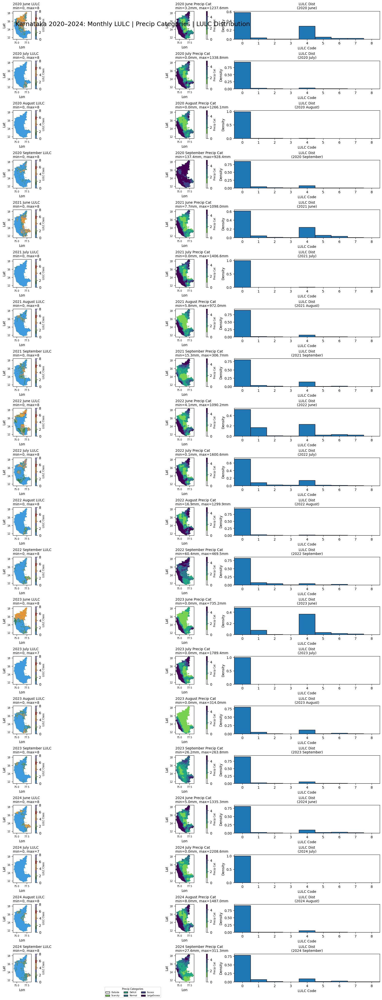

In [95]:
import os
import rasterio
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from rasterio.features import geometry_mask

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
# -----------------------------------------------------------------------------
lulc_tiff_path        = "Karnataka_X_LULC.tif"
precip_raw_tiff_path  = "Karnataka_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff_path  = "Karnataka_Y_Precipitation_GT_geotif.tif"
karnataka_shapefile   = os.path.join("SateMask", "gadm41_IND_1.shp")

for path in (lulc_tiff_path, precip_raw_tiff_path, precip_cat_tiff_path, karnataka_shapefile):
    if not os.path.isfile(path):
        raise FileNotFoundError(f"Cannot find {path!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ & MASK THE 20-BAND LULC TIFF
# -----------------------------------------------------------------------------
with rasterio.open(lulc_tiff_path) as src_lulc:
    lulc_bands     = src_lulc.read().astype(np.float32)  # (20, H, W)
    lulc_transform = src_lulc.transform
    lulc_crs       = src_lulc.crs
    height, width  = src_lulc.height, src_lulc.width
    bounds         = src_lulc.bounds

if lulc_bands.shape[0] != 20:
    raise ValueError(f"Expected 20 bands in {lulc_tiff_path}, but found {lulc_bands.shape[0]}")

# 2a) Load & reproject Karnataka boundary
gdf      = gpd.read_file(karnataka_shapefile)
gdf_kar  = gdf[gdf["NAME_1"].str.lower() == "karnataka"].copy()
if gdf_kar.empty:
    raise ValueError("No feature named 'Karnataka' found in shapefile.")
if gdf_kar.crs != lulc_crs:
    gdf_kar = gdf_kar.to_crs(lulc_crs)

# 2b) Build mask
kar_geom = [gdf_kar.geometry.unary_union]
kar_mask = geometry_mask(
    kar_geom,
    transform= lulc_transform,
    invert   = True,
    out_shape= (height, width)
)

# 2c) Apply mask to LULC bands
for i in range(20):
    band = lulc_bands[i]
    band[~kar_mask] = np.nan
    lulc_bands[i]   = band

# -----------------------------------------------------------------------------
# 3) READ & MASK THE 25-BAND RAW PRECIPITATION TIFF
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff_path) as src_pr_raw:
    precip_raw_full = src_pr_raw.read().astype(np.float32)  # (25, H, W)
if precip_raw_full.shape[0] != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff_path}, but found {precip_raw_full.shape[0]}")
for i in range(25):
    arr = precip_raw_full[i]
    arr[~kar_mask] = np.nan
    precip_raw_full[i] = arr

# -----------------------------------------------------------------------------
# 4) READ & MASK THE 25-BAND PRECIPITATION CATEGORY TIFF (codes –1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff_path) as src_pr_cat:
    precip_cat_full = src_pr_cat.read().astype(np.int8)  # (25, H, W)
if precip_cat_full.shape[0] != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff_path}, but found {precip_cat_full.shape[0]}")
for i in range(25):
    arr = precip_cat_full[i]
    arr[~kar_mask] = -1
    precip_cat_full[i] = arr

# -----------------------------------------------------------------------------
# 5) EXTRACT THE 20 MONTHLY PRECIPITATION BANDS (drop totals at 4,9,14,19,24)
# -----------------------------------------------------------------------------
monthly_idxs = []
for yr in range(5):
    base = yr * 5
    monthly_idxs.extend([base + m for m in range(4)])
precip_raw_bands = precip_raw_full[monthly_idxs]
precip_cat_bands = precip_cat_full[monthly_idxs]

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS & MONTHS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years, n_months = len(years), len(month_names)
n_total = n_years * n_months  # 20

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS & STATISTICS
# -----------------------------------------------------------------------------
# Dynamic World palette for LULC (0..8)
dw_palette = [
    "#419bdf", "#397d49", "#88b053", "#7a87c6", "#e49635",
    "#dfc35a", "#c4281b", "#a59b8f", "#b39fe1"
]
lulc_cmap = ListedColormap(dw_palette)

# Precip category palette (-1→0, then 0..4→1..5)
cluster_colors = [
    "#ffffff", "#79d151", "#22a784", "#29788e", "#404387", "#440154"
]
cluster_cmap   = ListedColormap(cluster_colors)
cluster_labels = {
    0: "Outside", 1: "Scarcity", 2: "Deficit",
    3: "Normal",  4: "Excess",   5: "LargeExcess"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 8) PLOT: 20 × 3 (LULC map | Precip Cat map | LULC histogram)
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_total, ncols=3,
    figsize=(20, n_total * 2.0),
    constrained_layout=True
)
fig.suptitle(
    "Karnataka 2020–2024: Monthly LULC | Precip Categories | LULC Distribution",
    fontsize=18, y=0.98
)

if n_total == 1:
    axes = axes[np.newaxis, :]

for idx in range(n_total):
    yr_i = idx // n_months
    mo_i = idx % n_months
    year, month = years[yr_i], month_names[mo_i]

    # — LULC layer & stats —
    layer = lulc_bands[idx]
    valid = layer[~np.isnan(layer)]
    lc_min = int(np.nanmin(valid)) if valid.size else None
    lc_max = int(np.nanmax(valid)) if valid.size else None

    ax0 = axes[idx, 0]
    im0 = ax0.imshow(
        layer, cmap=lulc_cmap, vmin=0, vmax=8,
        extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
        origin="upper"
    )
    t0 = f"{year} {month} LULC"
    if lc_min is not None:
        t0 += f"\nmin={lc_min}, max={lc_max}"
    ax0.set_title(t0, fontsize=10, loc="left")
    ax0.set_xlabel("Lon"); ax0.set_ylabel("Lat"); ax0.tick_params(labelsize=7)
    cb0 = fig.colorbar(im0, ax=ax0, orientation="vertical", fraction=0.045, pad=0.02)
    cb0.set_label("LULC Class", fontsize=7)

    # — Precip category & stats —
    rc = precip_cat_bands[idx]
    cat_plot = np.where(rc == -1, 0, rc + 1)
    pr = precip_raw_bands[idx]
    vp = pr[~np.isnan(pr)]
    pr_min = np.nanmin(vp) if vp.size else None
    pr_max = np.nanmax(vp) if vp.size else None

    ax1 = axes[idx, 1]
    im1 = ax1.imshow(
        cat_plot, cmap=cluster_cmap, vmin=0, vmax=5,
        extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
        origin="upper"
    )
    t1 = f"{year} {month} Precip Cat"
    if pr_min is not None:
        t1 += f"\nmin={pr_min:.1f}mm, max={pr_max:.1f}mm"
    ax1.set_title(t1, fontsize=10, loc="left")
    ax1.set_xlabel("Lon"); ax1.set_ylabel("Lat"); ax1.tick_params(labelsize=7)
    cb1 = fig.colorbar(im1, ax=ax1, orientation="vertical", fraction=0.045, pad=0.02)
    cb1.set_label("Precip Cat", fontsize=7)

    # — LULC histogram —
    ax2 = axes[idx, 2]
    if valid.size:
        ax2.hist(valid, bins=np.arange(-0.5,9.5,1), density=True, edgecolor="black")
        ax2.set_xticks(np.arange(0,9))
    else:
        ax2.text(0.5,0.5,"No Data", ha="center", va="center", fontsize=8, color="gray")
    ax2.set_title(f"LULC Dist\n({year} {month})", fontsize=10)
    ax2.set_xlabel("LULC Code"); ax2.set_ylabel("Density"); ax2.set_xlim(-0.5,8.5)

# -----------------------------------------------------------------------------
# 9) LEGEND FOR PRECIPITATION CATEGORIES
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Precip Categories",
    fontsize=6,
    title_fontsize=7,
    bbox_to_anchor=(0.5, -0.005)
)

plt.show()


In [ ]:
##Karnataka_X_Soil_Moisture

In [ ]:

// --------------------------------------------------------------------------------
// Compute Monthly‐Mean Soil Moisture for Karnataka (June–September, 2020–2024)
// using ERA5-Land Daily Aggregates (“ECMWF/ERA5_LAND/DAILY_AGGR”). We will produce
// 5 years × 4 months = 20 single‐band images, stack them into one 20-band GeoTIFF,
// and export as “Karnataka_X_Soil_Moisture.tif”.
// --------------------------------------------------------------------------------

// 1. Load Karnataka boundary from GAUL level1 and display it
var states     = ee.FeatureCollection("FAO/GAUL/2015/level1");
var karnataka  = states.filter(ee.Filter.eq('ADM1_NAME', 'Karnataka'));
Map.centerObject(karnataka, 7);
Map.addLayer(karnataka, { color: 'black' }, 'Karnataka Boundary');

// 2. Define the years (2020–2024) and monsoon months (June–September)
var years      = [2020, 2021, 2022, 2023, 2024];
var months     = [6, 7, 8, 9];
var monthNames = ['June', 'July', 'August', 'September'];

// 3. Build a list of single‐band soil‐moisture images (one per year & month)
var allBands = [];

// 3a. Loop over each year
years.forEach(function(year) {
  // 3b. Loop over each monsoon month
  months.forEach(function(m, idx) {
    // 3b.1 Define start/end dates for this month
    var start = ee.Date.fromYMD(year, m, 1);
    var end   = start.advance(1, 'month');

    // 3b.2 Load ERA5-Land Daily Aggregates for this month & Karnataka,
    //       selecting layer 1 soil moisture
    var smColl = ee.ImageCollection("ECMWF/ERA5_LAND/DAILY_AGGR")
                    .filterDate(start, end)
                    .filterBounds(karnataka)
                    .select('volumetric_soil_water_layer_1');

    // 3b.3 Compute monthly mean soil moisture, clip to Karnataka, rename band
    var monthlySM = smColl
                      .mean()
                      .clip(karnataka)
                      .rename(year + '_' + monthNames[idx] + '_SM');

    // 3b.4 (Optional) Print min/max to the Console for verification
    var stats = monthlySM.reduceRegion({
      reducer:    ee.Reducer.minMax(),
      geometry:   karnataka.geometry(),
      scale:      1000,
      bestEffort: true
    });
    print(year + ' ' + monthNames[idx] + ' Soil Moisture min/max:', stats);

    // 3b.5 Add this single-band image to our list
    allBands.push(monthlySM);

    // 3b.6 (Optional) Visualize on the map
    Map.addLayer(
      monthlySM,
      {
        min:     0.05,
        max:     0.55,
        palette: ['white', 'lightblue', 'navyblue', 'blue', 'darkblue']
      },
      year + ' ' + monthNames[idx] + ' Soil Moisture'
    );
  });
});

// 4. Stack all 20 monthly bands into one multi-band Image
var soilMoistureMultiband = ee.Image.cat(allBands);

// 5. Export the 20-band soil-moisture image to Google Drive
Export.image.toDrive({
  image:          soilMoistureMultiband,
  description:    'Karnataka_X_Soil_Moisture',   // Task name (no spaces)
  folder:         'GEE_Exports',                // Drive folder
  fileNamePrefix: 'Karnataka_X_Soil_Moisture',  // Output → “Karnataka_X_Soil_Moisture.tif”
  region:         karnataka.geometry(),         // Clip to Karnataka boundary
  scale:          1000,                         // 1 km resolution
  crs:            'EPSG:4326',
  maxPixels:      1e13
});


/tmp/ipykernel_6699/2145453575.py:48: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  kar_geom = [gdf_kar.geometry.unary_union]


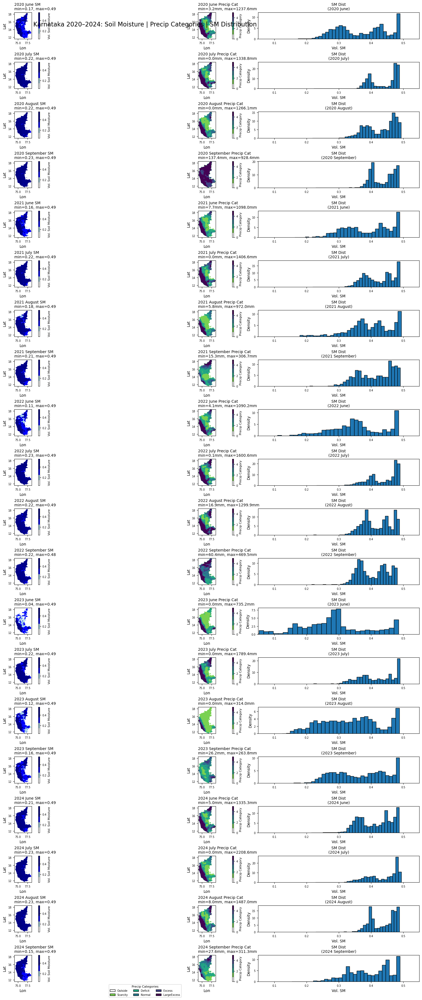

In [101]:
import os
import rasterio
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from rasterio.features import geometry_mask

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust as needed)
#    - Soil Moisture TIFF:          20 bands (2020–2024 × 4 months: June–September)
#    - Raw Precipitation TIFF:      25 bands (2020–2024 × 5: June, July, August, September, Total)
#    - Precipitation Category TIFF: 25 bands (2020–2024 × 5 categories)
#    - Karnataka mask shapefile:    "SateMask/gadm41_IND_1.shp"
# -----------------------------------------------------------------------------
sm_tiff_path        = "Karnataka_X_Soil_Moisture.tif"
precip_raw_tiff     = "Karnataka_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff     = "Karnataka_Y_Precipitation_GT_geotif.tif"
karnataka_shapefile = os.path.join("SateMask", "gadm41_IND_1.shp")

for path in (sm_tiff_path, precip_raw_tiff, precip_cat_tiff, karnataka_shapefile):
    if not os.path.isfile(path):
        raise FileNotFoundError(f"Cannot find {path!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ & MASK THE 20-BAND SOIL MOISTURE TIFF
# -----------------------------------------------------------------------------
with rasterio.open(sm_tiff_path) as src_sm:
    sm_bands      = src_sm.read().astype(np.float32)  # (20, H, W)
    sm_transform  = src_sm.transform
    sm_crs        = src_sm.crs
    height, width = src_sm.height, src_sm.width
    bounds        = src_sm.bounds

if sm_bands.shape[0] != 20:
    raise ValueError(f"Expected 20 bands in {sm_tiff_path}, but found {sm_bands.shape[0]}")

# 2a) Load & reproject Karnataka boundary
gdf      = gpd.read_file(karnataka_shapefile)
gdf_kar  = gdf[gdf["NAME_1"].str.lower() == "karnataka"].copy()
if gdf_kar.empty:
    raise ValueError("No feature named 'Karnataka' found in shapefile.")
if gdf_kar.crs != sm_crs:
    gdf_kar = gdf_kar.to_crs(sm_crs)

# 2b) Build mask for Karnataka
kar_geom = [gdf_kar.geometry.unary_union]
kar_mask = geometry_mask(
    kar_geom,
    transform=sm_transform,
    invert   =True,        # True = keep inside Karnataka
    out_shape=(height, width)
)

# 2c) Mask soil moisture bands outside Karnataka → set to NaN
for i in range(20):
    band = sm_bands[i]
    band[~kar_mask] = np.nan
    sm_bands[i]     = band

# -----------------------------------------------------------------------------
# 3) READ & MASK THE 25-BAND RAW PRECIPITATION TIFF (in mm)
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff) as src_pr:
    pr_raw_full = src_pr.read().astype(np.float32)  # (25, H, W)

if pr_raw_full.shape[0] != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff}, but found {pr_raw_full.shape[0]}")
for i in range(25):
    arr = pr_raw_full[i]
    arr[~kar_mask] = np.nan
    pr_raw_full[i] = arr

# -----------------------------------------------------------------------------
# 4) READ & MASK THE 25-BAND PRECIPITATION CATEGORY TIFF (codes –1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff) as src_pc:
    pr_cat_full = src_pc.read().astype(np.int8)  # (25, H, W)

if pr_cat_full.shape[0] != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff}, but found {pr_cat_full.shape[0]}")
for i in range(25):
    arr = pr_cat_full[i]
    arr[~kar_mask] = -1
    pr_cat_full[i] = arr

# -----------------------------------------------------------------------------
# 5) EXTRACT THE 20 MONTHLY PRECIPITATION BANDS
#    (drop each year’s “Total” at indices 4, 9, 14, 19, 24)
# -----------------------------------------------------------------------------
monthly_idxs = []
for y in range(5):
    base = y * 5
    monthly_idxs.extend([base + m for m in range(4)])
pr_raw = pr_raw_full[monthly_idxs]  # (20, H, W)
pr_cat = pr_cat_full[monthly_idxs]  # (20, H, W)

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS & MONTHS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years, n_months = len(years), len(month_names)
n_total = n_years * n_months  # 20

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS & STATISTICS
# -----------------------------------------------------------------------------
# 7a) Soil moisture colormap (white→navy)
sm_cmap = ListedColormap(["white","lightblue","blue","darkblue","navy"])
sm_vmin, sm_vmax = 0.05, 0.55

# 7b) Precipitation category colormap (-1→0, 0→1…4→5)
pc_colors = ["#ffffff","#79d151","#22a784","#29788e","#404387","#440154"]
pc_labels = {
    0:"Outside", 1:"Scarcity", 2:"Deficit",
    3:"Normal", 4:"Excess", 5:"LargeExcess"
}
pc_cmap    = ListedColormap(pc_colors)
pc_handles = [Patch(facecolor=pc_colors[i], edgecolor="black", label=pc_labels[i])
              for i in range(len(pc_colors))]

# -----------------------------------------------------------------------------
# 8) PLOT: 20 rows × 3 columns
#     Col 0 = Soil Moisture map
#     Col 1 = Precip Category map
#     Col 2 = Soil Moisture distribution histogram
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_total, ncols=3,
    figsize=(20, n_total * 1.8),
    constrained_layout=True
)
fig.suptitle(
    "Karnataka 2020–2024: Soil Moisture | Precip Categories | SM Distribution",
    fontsize=16, y=0.98
)

if n_total == 1:
    axes = axes[np.newaxis, :]

for idx in range(n_total):
    yr_i = idx // n_months
    mo_i = idx % n_months
    year = years[yr_i]
    month= month_names[mo_i]

    # — Soil moisture stats & map —
    layer = sm_bands[idx]
    valid = layer[~np.isnan(layer)]
    sm_min = float(np.nanmin(valid)) if valid.size else None
    sm_max = float(np.nanmax(valid)) if valid.size else None

    ax0 = axes[idx,0]
    im0 = ax0.imshow(
        layer, cmap=sm_cmap, vmin=sm_vmin, vmax=sm_vmax,
        extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
        origin="upper"
    )
    title0 = f"{year} {month} SM"
    if sm_min is not None:
        title0+=f"\nmin={sm_min:.2f}, max={sm_max:.2f}"
    ax0.set_title(title0, loc="left", fontsize=10)
    ax0.set_xlabel("Lon"); ax0.set_ylabel("Lat"); ax0.tick_params(labelsize=7)
    c0 = fig.colorbar(im0, ax=ax0, orientation="vertical", fraction=0.04, pad=0.02)
    c0.set_label("Vol. Soil Moisture", fontsize=8); c0.ax.tick_params(labelsize=7)

    # — Precip category stats & map —
    raw_cat = pr_cat[idx]
    catplt  = np.where(raw_cat==-1, 0, raw_cat+1)
    prv     = pr_raw[idx][~np.isnan(pr_raw[idx])]
    pr_min  = float(np.nanmin(prv)) if prv.size else None
    pr_max  = float(np.nanmax(prv)) if prv.size else None

    ax1 = axes[idx,1]
    im1 = ax1.imshow(
        catplt, cmap=pc_cmap, vmin=0, vmax=5,
        extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
        origin="upper"
    )
    title1 = f"{year} {month} Precip Cat"
    if pr_min is not None:
        title1+=f"\nmin={pr_min:.1f}mm, max={pr_max:.1f}mm"
    ax1.set_title(title1, loc="left", fontsize=10)
    ax1.set_xlabel("Lon"); ax1.set_ylabel("Lat"); ax1.tick_params(labelsize=7)
    c1 = fig.colorbar(im1, ax=ax1, orientation="vertical", fraction=0.04, pad=0.02)
    c1.set_label("Precip Category", fontsize=8); c1.ax.tick_params(labelsize=7)

    # — SM histogram —
    ax2 = axes[idx,2]
    if valid.size:
        ax2.hist(valid, bins=30, density=True, edgecolor="black")
        ax2.set_xlim(sm_vmin, sm_vmax)
    else:
        ax2.text(0.5,0.5,"No Data", ha="center",va="center",fontsize=8,color="gray")
    ax2.set_title(f"SM Dist\n({year} {month})", fontsize=10)
    ax2.set_xlabel("Vol. SM"); ax2.set_ylabel("Density"); ax2.tick_params(labelsize=7)

# -----------------------------------------------------------------------------
# 9) Legend for Precipitation Categories at bottom
# -----------------------------------------------------------------------------
fig.legend(
    handles=pc_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Precip Categories",
    fontsize=7,
    title_fontsize=8,
    bbox_to_anchor=(0.5, -0.005)
)

plt.show()


In [ ]:
##Karnatka_X_elevation